# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

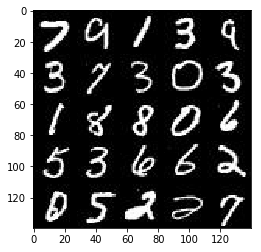

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

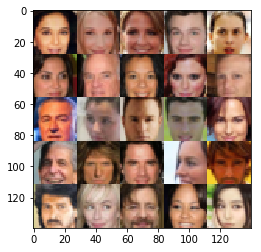

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [3]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [4]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels), name='real_input')
    z_input = tf.placeholder(tf.float32, shape=(None, z_dim), name='z_input')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return (real_input, z_input, learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [5]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.8):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input 28x28x3
        
        c1 = tf.layers.conv2d(images, filters=64, kernel_size=(5,5), strides=(2,2), padding='SAME', 
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        d1 = tf.nn.dropout(c1, keep_prob=keep_prob)
        reul1 = tf.maximum(alpha*d1, d1)
        # 14X14x64
        
        c2 = tf.layers.conv2d(c1, filters=128, kernel_size=(5,5), strides=(2,2), padding='SAME', 
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        d2 = tf.nn.dropout(c2, keep_prob=keep_prob)
        bn2 = tf.layers.batch_normalization(d2, training=True)
        relu2 = tf.maximum(alpha*bn2, bn2)
        # 7x7x128
        
        c3 = tf.layers.conv2d(c2, filters=256, kernel_size=(5,5), strides=(2,2), padding='SAME', 
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        d3 = tf.nn.dropout(c3, keep_prob=keep_prob)
        bn3 = tf.layers.batch_normalization(d3, training=True)
        relu3 = tf.maximum(alpha*bn3, bn3)
        # 4x4x256
        
        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [6]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=0.8):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        # Project input vector
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape to start convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1, x1)
        # 2x2x512
        
        x2 = tf.layers.conv2d_transpose(x1, filters=256, kernel_size=(5,5), strides=(2,2), padding='VALID',
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        x2 = tf.nn.dropout(x2, keep_prob=keep_prob)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2, x2)
        # 7x7x256
        
        x3 = tf.layers.conv2d_transpose(x2, filters=128, kernel_size=(5,5), strides=(2,2), padding='SAME',
                kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        x3 = tf.nn.dropout(x3, keep_prob=keep_prob)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3)
        # 14x14x128
        
        logits = tf.layers.conv2d_transpose(x3, filters=out_channel_dim, kernel_size=(5,5), strides=(2,2), padding='SAME',
                    kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        # 28x28x3
        out = tf.tanh(logits)
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [7]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, keep_prob=0.8):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_faked = generator(input_z, out_channel_dim, is_train=True, alpha=alpha, keep_prob=keep_prob)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False, alpha=alpha, keep_prob=keep_prob)
    d_model_fake, d_logits_fake = discriminator(g_faked, reuse=True, alpha=alpha, keep_prob=keep_prob)
    
    # Add smoothing to reduce labels
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_real, labels=(tf.ones_like(d_model_real) * 0.9)
        )
    )
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)
        )
    )
    
    d_loss = d_loss_fake + d_loss_real
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, labels=(tf.ones_like(d_model_fake))
        )
    )
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [8]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [9]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [16]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    alpha = 0.12
    keep_prob = 0.75
    n_samples, width, height, channels = data_shape
    input_real, input_z, learning_rate_tf = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels, alpha=alpha, keep_prob=keep_prob)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate_tf, beta1)
    
    current_step = 0
    print_loss_every = 10
    show_image_every = 50
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                current_step +=1
                
                batch_images *= 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_tf:learning_rate})
                sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_tf:learning_rate})
                sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_tf:learning_rate})
                
                if current_step % print_loss_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                if current_step % show_image_every == 0:
                    n_images = 16
                    show_generator_output(sess, n_images, input_z, channels, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 0/2... Discriminator Loss: 0.3918... Generator Loss: 4.3410
Epoch 0/2... Discriminator Loss: 0.5700... Generator Loss: 1.6509
Epoch 0/2... Discriminator Loss: 0.4418... Generator Loss: 5.8117
Epoch 0/2... Discriminator Loss: 3.5756... Generator Loss: 10.7668
Epoch 0/2... Discriminator Loss: 1.8735... Generator Loss: 0.3537


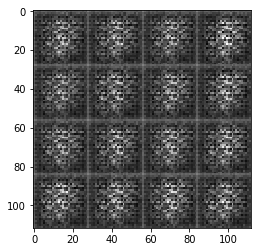

Epoch 0/2... Discriminator Loss: 1.2297... Generator Loss: 7.3643
Epoch 0/2... Discriminator Loss: 0.9835... Generator Loss: 2.4540
Epoch 0/2... Discriminator Loss: 1.1929... Generator Loss: 0.8845
Epoch 0/2... Discriminator Loss: 0.6444... Generator Loss: 3.6339
Epoch 0/2... Discriminator Loss: 1.0918... Generator Loss: 5.0030


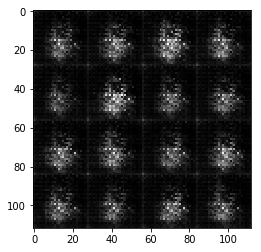

Epoch 0/2... Discriminator Loss: 1.0230... Generator Loss: 4.2253
Epoch 0/2... Discriminator Loss: 0.6738... Generator Loss: 3.6987
Epoch 0/2... Discriminator Loss: 0.5685... Generator Loss: 2.2770
Epoch 0/2... Discriminator Loss: 1.0252... Generator Loss: 4.5466
Epoch 0/2... Discriminator Loss: 0.9383... Generator Loss: 1.2195


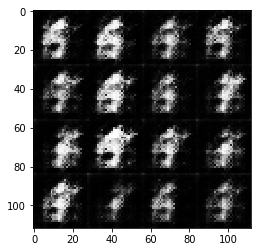

Epoch 0/2... Discriminator Loss: 0.7050... Generator Loss: 2.3981
Epoch 0/2... Discriminator Loss: 1.1622... Generator Loss: 0.8243
Epoch 0/2... Discriminator Loss: 0.8884... Generator Loss: 1.4048
Epoch 0/2... Discriminator Loss: 0.8713... Generator Loss: 1.3876
Epoch 0/2... Discriminator Loss: 0.8689... Generator Loss: 1.4012


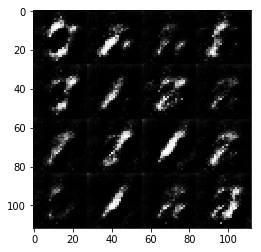

Epoch 0/2... Discriminator Loss: 1.2308... Generator Loss: 0.7918
Epoch 0/2... Discriminator Loss: 0.7910... Generator Loss: 2.4820
Epoch 0/2... Discriminator Loss: 1.1735... Generator Loss: 0.7939
Epoch 0/2... Discriminator Loss: 0.8690... Generator Loss: 1.2526
Epoch 0/2... Discriminator Loss: 1.0866... Generator Loss: 1.0516


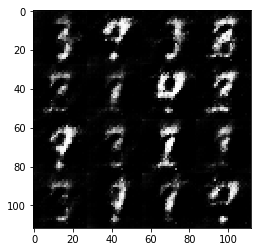

Epoch 0/2... Discriminator Loss: 0.9449... Generator Loss: 1.2425
Epoch 0/2... Discriminator Loss: 1.0989... Generator Loss: 1.2326
Epoch 0/2... Discriminator Loss: 1.1131... Generator Loss: 1.5773
Epoch 0/2... Discriminator Loss: 1.0329... Generator Loss: 1.0851
Epoch 0/2... Discriminator Loss: 1.0649... Generator Loss: 0.9550


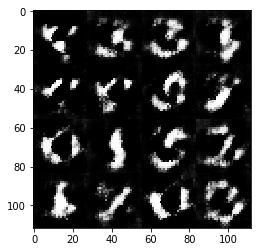

Epoch 0/2... Discriminator Loss: 0.9592... Generator Loss: 1.4749
Epoch 0/2... Discriminator Loss: 0.9356... Generator Loss: 1.5521
Epoch 0/2... Discriminator Loss: 0.9162... Generator Loss: 1.2172
Epoch 0/2... Discriminator Loss: 0.9422... Generator Loss: 1.4885
Epoch 0/2... Discriminator Loss: 0.9929... Generator Loss: 1.2815


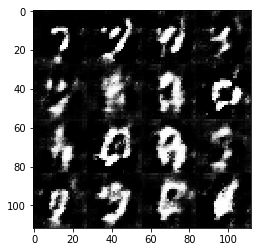

Epoch 0/2... Discriminator Loss: 1.2593... Generator Loss: 1.0285
Epoch 0/2... Discriminator Loss: 1.5475... Generator Loss: 0.9654
Epoch 0/2... Discriminator Loss: 1.4624... Generator Loss: 1.4483
Epoch 0/2... Discriminator Loss: 1.2927... Generator Loss: 0.8626
Epoch 0/2... Discriminator Loss: 1.2163... Generator Loss: 1.4979


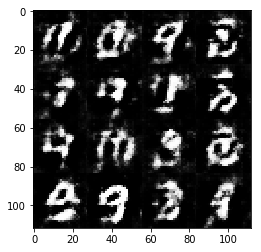

Epoch 0/2... Discriminator Loss: 1.2389... Generator Loss: 0.6813
Epoch 0/2... Discriminator Loss: 1.0417... Generator Loss: 0.9229
Epoch 0/2... Discriminator Loss: 1.2098... Generator Loss: 0.8023
Epoch 0/2... Discriminator Loss: 1.2070... Generator Loss: 1.0200
Epoch 0/2... Discriminator Loss: 1.4702... Generator Loss: 0.9294


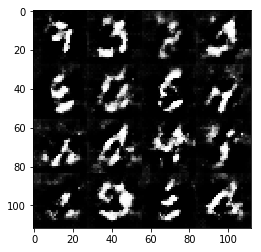

Epoch 0/2... Discriminator Loss: 1.2583... Generator Loss: 1.3254
Epoch 0/2... Discriminator Loss: 1.2499... Generator Loss: 0.8530
Epoch 0/2... Discriminator Loss: 1.1142... Generator Loss: 1.1515
Epoch 0/2... Discriminator Loss: 1.1010... Generator Loss: 1.2750
Epoch 0/2... Discriminator Loss: 1.0824... Generator Loss: 1.1345


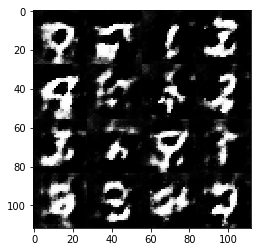

Epoch 0/2... Discriminator Loss: 1.1361... Generator Loss: 1.1072
Epoch 0/2... Discriminator Loss: 1.3031... Generator Loss: 0.8469
Epoch 0/2... Discriminator Loss: 1.3279... Generator Loss: 0.6854
Epoch 0/2... Discriminator Loss: 1.1181... Generator Loss: 0.8890
Epoch 0/2... Discriminator Loss: 1.0909... Generator Loss: 1.2389


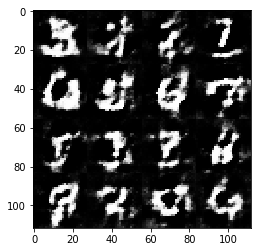

Epoch 0/2... Discriminator Loss: 1.3431... Generator Loss: 1.1754
Epoch 0/2... Discriminator Loss: 1.2103... Generator Loss: 1.5691
Epoch 0/2... Discriminator Loss: 1.2989... Generator Loss: 0.8721
Epoch 0/2... Discriminator Loss: 1.0691... Generator Loss: 1.1264
Epoch 0/2... Discriminator Loss: 1.2938... Generator Loss: 0.8080


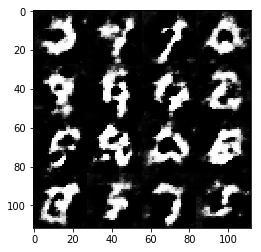

Epoch 0/2... Discriminator Loss: 1.1405... Generator Loss: 1.2337
Epoch 0/2... Discriminator Loss: 1.1480... Generator Loss: 1.1750
Epoch 0/2... Discriminator Loss: 1.2804... Generator Loss: 1.1427
Epoch 0/2... Discriminator Loss: 1.1734... Generator Loss: 1.0789
Epoch 0/2... Discriminator Loss: 1.2268... Generator Loss: 0.9042


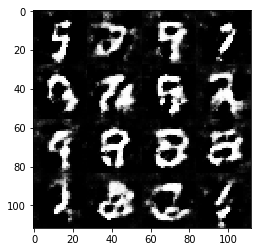

Epoch 0/2... Discriminator Loss: 1.1967... Generator Loss: 1.0501
Epoch 0/2... Discriminator Loss: 1.1667... Generator Loss: 1.0866
Epoch 0/2... Discriminator Loss: 1.1969... Generator Loss: 0.9876
Epoch 0/2... Discriminator Loss: 0.9924... Generator Loss: 1.2609
Epoch 0/2... Discriminator Loss: 1.2831... Generator Loss: 0.7931


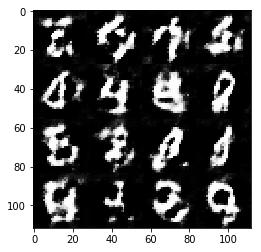

Epoch 0/2... Discriminator Loss: 1.1011... Generator Loss: 1.2808
Epoch 0/2... Discriminator Loss: 1.2613... Generator Loss: 0.8933
Epoch 0/2... Discriminator Loss: 1.1654... Generator Loss: 0.9885
Epoch 0/2... Discriminator Loss: 1.1953... Generator Loss: 1.0283
Epoch 0/2... Discriminator Loss: 1.2243... Generator Loss: 0.9036


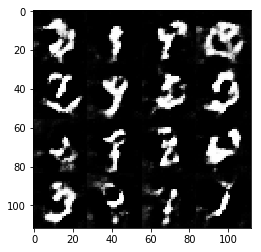

Epoch 0/2... Discriminator Loss: 1.1392... Generator Loss: 1.0754
Epoch 0/2... Discriminator Loss: 1.2440... Generator Loss: 0.7188
Epoch 0/2... Discriminator Loss: 1.3302... Generator Loss: 0.7100
Epoch 0/2... Discriminator Loss: 1.3068... Generator Loss: 1.0342
Epoch 0/2... Discriminator Loss: 1.1656... Generator Loss: 1.0772


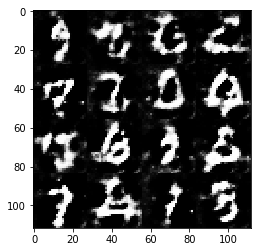

Epoch 0/2... Discriminator Loss: 1.2334... Generator Loss: 0.8460
Epoch 0/2... Discriminator Loss: 1.0876... Generator Loss: 1.1092
Epoch 0/2... Discriminator Loss: 1.2638... Generator Loss: 0.8222
Epoch 0/2... Discriminator Loss: 1.1816... Generator Loss: 0.9517
Epoch 0/2... Discriminator Loss: 1.1687... Generator Loss: 0.9750


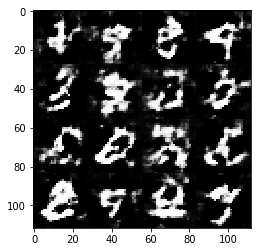

Epoch 0/2... Discriminator Loss: 1.2869... Generator Loss: 0.8667
Epoch 0/2... Discriminator Loss: 1.1263... Generator Loss: 1.1395
Epoch 0/2... Discriminator Loss: 1.1717... Generator Loss: 1.0427
Epoch 0/2... Discriminator Loss: 1.1778... Generator Loss: 0.9744
Epoch 0/2... Discriminator Loss: 1.3132... Generator Loss: 1.0272


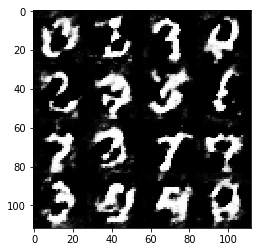

Epoch 0/2... Discriminator Loss: 1.2072... Generator Loss: 1.1658
Epoch 0/2... Discriminator Loss: 1.1221... Generator Loss: 1.0306
Epoch 0/2... Discriminator Loss: 1.3436... Generator Loss: 0.7806
Epoch 0/2... Discriminator Loss: 1.0230... Generator Loss: 1.1126
Epoch 0/2... Discriminator Loss: 1.1675... Generator Loss: 0.9948


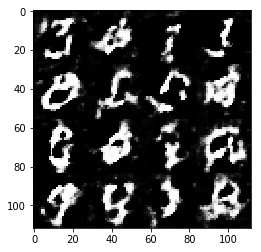

Epoch 0/2... Discriminator Loss: 1.3108... Generator Loss: 0.8817
Epoch 0/2... Discriminator Loss: 1.2990... Generator Loss: 0.9468
Epoch 0/2... Discriminator Loss: 1.2184... Generator Loss: 0.9226
Epoch 0/2... Discriminator Loss: 1.1810... Generator Loss: 0.9070
Epoch 0/2... Discriminator Loss: 1.1288... Generator Loss: 0.8938


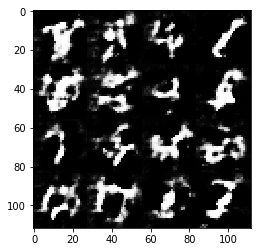

Epoch 0/2... Discriminator Loss: 1.1945... Generator Loss: 1.1668
Epoch 0/2... Discriminator Loss: 1.0734... Generator Loss: 0.9682
Epoch 0/2... Discriminator Loss: 1.1554... Generator Loss: 1.0055
Epoch 0/2... Discriminator Loss: 1.2040... Generator Loss: 0.9556
Epoch 0/2... Discriminator Loss: 1.1693... Generator Loss: 1.1355


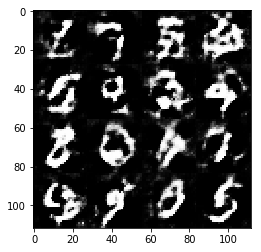

Epoch 0/2... Discriminator Loss: 1.0469... Generator Loss: 1.1297
Epoch 0/2... Discriminator Loss: 1.2596... Generator Loss: 0.8720
Epoch 0/2... Discriminator Loss: 1.2596... Generator Loss: 0.8521
Epoch 0/2... Discriminator Loss: 1.1785... Generator Loss: 0.9099
Epoch 0/2... Discriminator Loss: 1.3156... Generator Loss: 0.8372


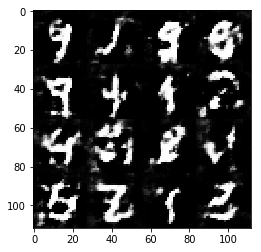

Epoch 0/2... Discriminator Loss: 1.2142... Generator Loss: 1.0487
Epoch 0/2... Discriminator Loss: 1.1392... Generator Loss: 1.0666
Epoch 0/2... Discriminator Loss: 1.2394... Generator Loss: 0.9126
Epoch 0/2... Discriminator Loss: 1.0836... Generator Loss: 0.9712
Epoch 0/2... Discriminator Loss: 1.1566... Generator Loss: 0.9349


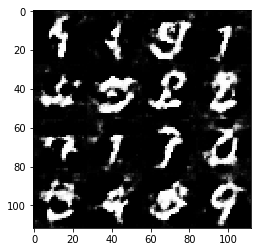

Epoch 0/2... Discriminator Loss: 1.1499... Generator Loss: 0.8270
Epoch 0/2... Discriminator Loss: 1.1750... Generator Loss: 1.1586
Epoch 0/2... Discriminator Loss: 1.1850... Generator Loss: 0.9226
Epoch 0/2... Discriminator Loss: 1.2506... Generator Loss: 0.8812
Epoch 0/2... Discriminator Loss: 1.2457... Generator Loss: 0.9598


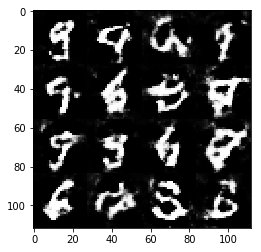

Epoch 0/2... Discriminator Loss: 1.4080... Generator Loss: 0.8995
Epoch 0/2... Discriminator Loss: 1.2860... Generator Loss: 0.9153
Epoch 0/2... Discriminator Loss: 1.2584... Generator Loss: 0.9208
Epoch 0/2... Discriminator Loss: 1.1563... Generator Loss: 1.0031
Epoch 0/2... Discriminator Loss: 1.1984... Generator Loss: 0.9244


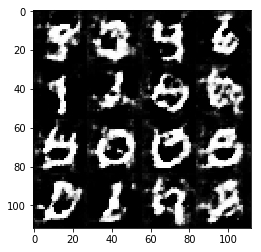

Epoch 0/2... Discriminator Loss: 1.1217... Generator Loss: 1.0949
Epoch 0/2... Discriminator Loss: 1.3186... Generator Loss: 0.9006
Epoch 0/2... Discriminator Loss: 1.1791... Generator Loss: 1.1060
Epoch 0/2... Discriminator Loss: 1.2767... Generator Loss: 0.9288
Epoch 0/2... Discriminator Loss: 1.1795... Generator Loss: 1.0461


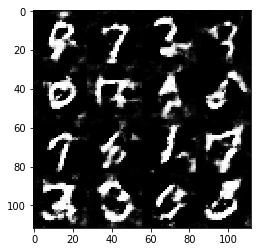

Epoch 0/2... Discriminator Loss: 1.3151... Generator Loss: 0.8123
Epoch 0/2... Discriminator Loss: 1.3129... Generator Loss: 0.9139
Epoch 0/2... Discriminator Loss: 1.3452... Generator Loss: 0.9062
Epoch 0/2... Discriminator Loss: 1.1741... Generator Loss: 1.0599
Epoch 0/2... Discriminator Loss: 1.2799... Generator Loss: 0.9519


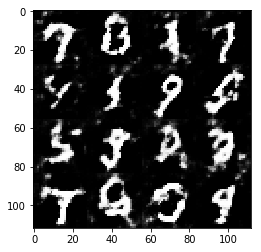

Epoch 0/2... Discriminator Loss: 1.2791... Generator Loss: 0.7386
Epoch 0/2... Discriminator Loss: 1.2147... Generator Loss: 1.0793
Epoch 0/2... Discriminator Loss: 1.2790... Generator Loss: 1.1433
Epoch 0/2... Discriminator Loss: 1.1428... Generator Loss: 0.9715
Epoch 0/2... Discriminator Loss: 1.2916... Generator Loss: 0.9880


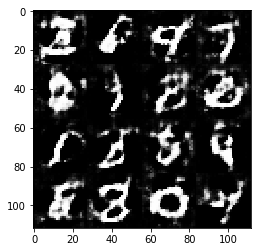

Epoch 0/2... Discriminator Loss: 1.1463... Generator Loss: 0.9582
Epoch 0/2... Discriminator Loss: 1.0724... Generator Loss: 0.9002
Epoch 0/2... Discriminator Loss: 1.2385... Generator Loss: 1.0697
Epoch 0/2... Discriminator Loss: 1.1502... Generator Loss: 0.9594
Epoch 0/2... Discriminator Loss: 1.1814... Generator Loss: 0.7999


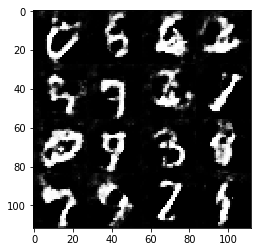

Epoch 0/2... Discriminator Loss: 1.2400... Generator Loss: 1.0596
Epoch 0/2... Discriminator Loss: 1.1518... Generator Loss: 1.0531
Epoch 0/2... Discriminator Loss: 1.3132... Generator Loss: 0.8519
Epoch 0/2... Discriminator Loss: 1.1980... Generator Loss: 0.9093
Epoch 0/2... Discriminator Loss: 1.1660... Generator Loss: 0.9260


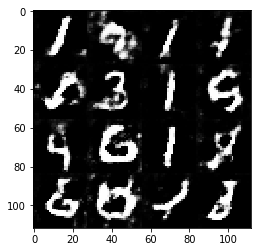

Epoch 0/2... Discriminator Loss: 1.1952... Generator Loss: 0.9444
Epoch 0/2... Discriminator Loss: 1.3010... Generator Loss: 1.0551
Epoch 0/2... Discriminator Loss: 1.2536... Generator Loss: 0.8389
Epoch 0/2... Discriminator Loss: 1.2825... Generator Loss: 0.9028
Epoch 0/2... Discriminator Loss: 1.2574... Generator Loss: 0.8448


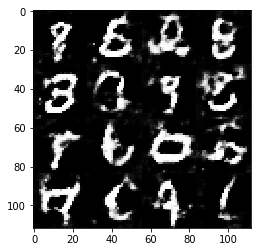

Epoch 0/2... Discriminator Loss: 1.2479... Generator Loss: 1.0561
Epoch 0/2... Discriminator Loss: 1.1927... Generator Loss: 0.9464
Epoch 0/2... Discriminator Loss: 1.3035... Generator Loss: 0.8981
Epoch 0/2... Discriminator Loss: 1.1862... Generator Loss: 1.0085
Epoch 0/2... Discriminator Loss: 1.2759... Generator Loss: 0.9952


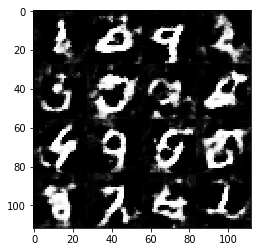

Epoch 0/2... Discriminator Loss: 1.2820... Generator Loss: 1.0240
Epoch 0/2... Discriminator Loss: 1.1576... Generator Loss: 0.9210
Epoch 0/2... Discriminator Loss: 1.2368... Generator Loss: 0.9524
Epoch 0/2... Discriminator Loss: 1.2729... Generator Loss: 0.8331
Epoch 0/2... Discriminator Loss: 1.0932... Generator Loss: 1.1630


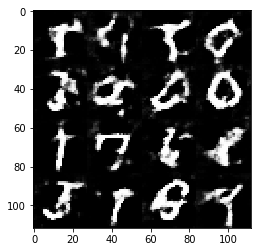

Epoch 0/2... Discriminator Loss: 1.3052... Generator Loss: 0.9072
Epoch 0/2... Discriminator Loss: 1.2239... Generator Loss: 0.9450
Epoch 0/2... Discriminator Loss: 1.2208... Generator Loss: 0.9531
Epoch 0/2... Discriminator Loss: 1.2838... Generator Loss: 0.9471
Epoch 0/2... Discriminator Loss: 1.1943... Generator Loss: 1.0294


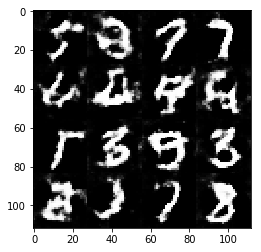

Epoch 0/2... Discriminator Loss: 1.1927... Generator Loss: 1.1525
Epoch 0/2... Discriminator Loss: 1.2657... Generator Loss: 0.8480
Epoch 0/2... Discriminator Loss: 1.1580... Generator Loss: 0.7950
Epoch 0/2... Discriminator Loss: 1.2771... Generator Loss: 0.9465
Epoch 0/2... Discriminator Loss: 1.2756... Generator Loss: 0.9894


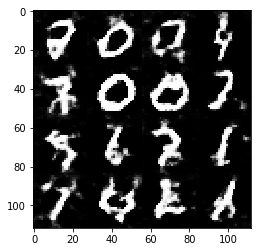

Epoch 0/2... Discriminator Loss: 1.3561... Generator Loss: 0.7997
Epoch 0/2... Discriminator Loss: 1.2049... Generator Loss: 1.1227
Epoch 0/2... Discriminator Loss: 1.1686... Generator Loss: 0.9373
Epoch 0/2... Discriminator Loss: 1.2037... Generator Loss: 1.0969
Epoch 0/2... Discriminator Loss: 1.2087... Generator Loss: 0.9732


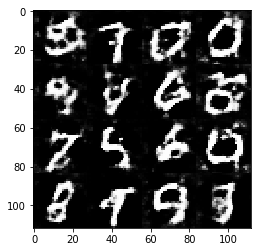

Epoch 0/2... Discriminator Loss: 1.2620... Generator Loss: 0.8303
Epoch 0/2... Discriminator Loss: 1.1969... Generator Loss: 0.8629
Epoch 0/2... Discriminator Loss: 1.3402... Generator Loss: 0.7650
Epoch 0/2... Discriminator Loss: 1.1917... Generator Loss: 0.9707
Epoch 0/2... Discriminator Loss: 1.2604... Generator Loss: 1.0657


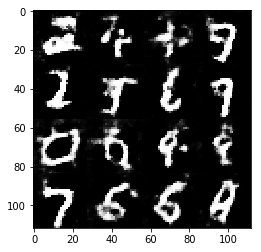

Epoch 0/2... Discriminator Loss: 1.2568... Generator Loss: 0.9458
Epoch 0/2... Discriminator Loss: 1.3074... Generator Loss: 1.1564
Epoch 1/2... Discriminator Loss: 1.2290... Generator Loss: 0.9676
Epoch 1/2... Discriminator Loss: 1.2387... Generator Loss: 0.9236
Epoch 1/2... Discriminator Loss: 1.2622... Generator Loss: 0.9162


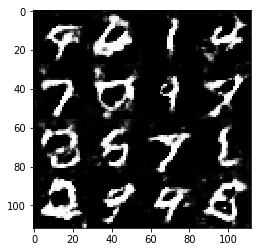

Epoch 1/2... Discriminator Loss: 1.0737... Generator Loss: 1.0135
Epoch 1/2... Discriminator Loss: 1.3224... Generator Loss: 0.8481
Epoch 1/2... Discriminator Loss: 1.3407... Generator Loss: 0.8951
Epoch 1/2... Discriminator Loss: 1.3138... Generator Loss: 0.9258
Epoch 1/2... Discriminator Loss: 1.1478... Generator Loss: 1.0734


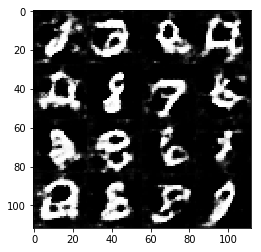

Epoch 1/2... Discriminator Loss: 1.1591... Generator Loss: 0.9050
Epoch 1/2... Discriminator Loss: 1.2245... Generator Loss: 0.8601
Epoch 1/2... Discriminator Loss: 1.1447... Generator Loss: 0.9630
Epoch 1/2... Discriminator Loss: 1.2493... Generator Loss: 0.8767
Epoch 1/2... Discriminator Loss: 1.2949... Generator Loss: 0.8705


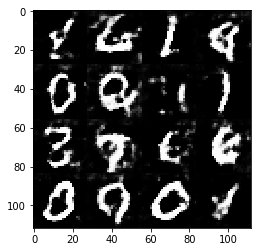

Epoch 1/2... Discriminator Loss: 1.2062... Generator Loss: 0.8899
Epoch 1/2... Discriminator Loss: 1.3169... Generator Loss: 0.9417
Epoch 1/2... Discriminator Loss: 1.2044... Generator Loss: 0.9147
Epoch 1/2... Discriminator Loss: 1.2689... Generator Loss: 0.9416
Epoch 1/2... Discriminator Loss: 1.2792... Generator Loss: 0.8117


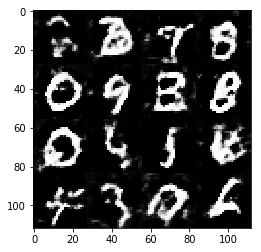

Epoch 1/2... Discriminator Loss: 1.1908... Generator Loss: 0.9289
Epoch 1/2... Discriminator Loss: 1.1715... Generator Loss: 0.9578
Epoch 1/2... Discriminator Loss: 1.2276... Generator Loss: 0.8694
Epoch 1/2... Discriminator Loss: 1.3276... Generator Loss: 0.8185
Epoch 1/2... Discriminator Loss: 1.2781... Generator Loss: 0.8345


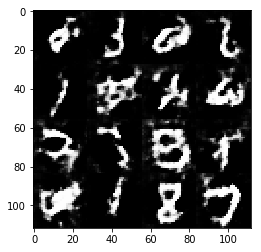

Epoch 1/2... Discriminator Loss: 1.2406... Generator Loss: 0.8804
Epoch 1/2... Discriminator Loss: 1.2708... Generator Loss: 0.9246
Epoch 1/2... Discriminator Loss: 1.2717... Generator Loss: 0.8958
Epoch 1/2... Discriminator Loss: 1.2524... Generator Loss: 0.8377
Epoch 1/2... Discriminator Loss: 1.2738... Generator Loss: 0.8976


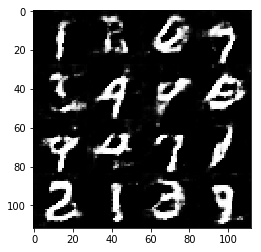

Epoch 1/2... Discriminator Loss: 1.3326... Generator Loss: 0.9399
Epoch 1/2... Discriminator Loss: 1.2256... Generator Loss: 0.8849
Epoch 1/2... Discriminator Loss: 1.3509... Generator Loss: 0.7692
Epoch 1/2... Discriminator Loss: 1.2058... Generator Loss: 1.1020
Epoch 1/2... Discriminator Loss: 1.3434... Generator Loss: 0.8915


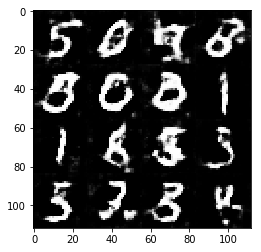

Epoch 1/2... Discriminator Loss: 1.2829... Generator Loss: 0.9433
Epoch 1/2... Discriminator Loss: 1.2408... Generator Loss: 0.8612
Epoch 1/2... Discriminator Loss: 1.2040... Generator Loss: 0.9942
Epoch 1/2... Discriminator Loss: 1.3123... Generator Loss: 1.0457
Epoch 1/2... Discriminator Loss: 1.4434... Generator Loss: 0.8083


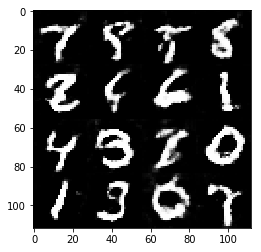

Epoch 1/2... Discriminator Loss: 1.1792... Generator Loss: 1.0182
Epoch 1/2... Discriminator Loss: 1.2475... Generator Loss: 0.9240
Epoch 1/2... Discriminator Loss: 1.1941... Generator Loss: 0.8527
Epoch 1/2... Discriminator Loss: 1.1291... Generator Loss: 0.9829
Epoch 1/2... Discriminator Loss: 1.3223... Generator Loss: 0.7634


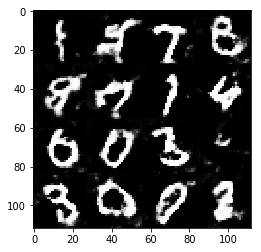

Epoch 1/2... Discriminator Loss: 1.2021... Generator Loss: 0.9041
Epoch 1/2... Discriminator Loss: 1.3064... Generator Loss: 0.8629
Epoch 1/2... Discriminator Loss: 1.3350... Generator Loss: 0.9766
Epoch 1/2... Discriminator Loss: 1.2495... Generator Loss: 0.9115
Epoch 1/2... Discriminator Loss: 1.3144... Generator Loss: 0.8548


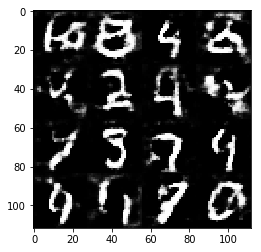

Epoch 1/2... Discriminator Loss: 1.2704... Generator Loss: 0.8942
Epoch 1/2... Discriminator Loss: 1.2687... Generator Loss: 0.9650
Epoch 1/2... Discriminator Loss: 1.2626... Generator Loss: 0.9179
Epoch 1/2... Discriminator Loss: 1.3438... Generator Loss: 0.8328
Epoch 1/2... Discriminator Loss: 1.2315... Generator Loss: 0.9851


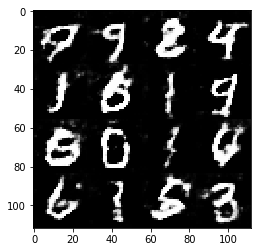

Epoch 1/2... Discriminator Loss: 1.3120... Generator Loss: 0.7059
Epoch 1/2... Discriminator Loss: 1.2542... Generator Loss: 0.9670
Epoch 1/2... Discriminator Loss: 1.2118... Generator Loss: 0.9125
Epoch 1/2... Discriminator Loss: 1.2466... Generator Loss: 0.7563
Epoch 1/2... Discriminator Loss: 1.3334... Generator Loss: 0.8122


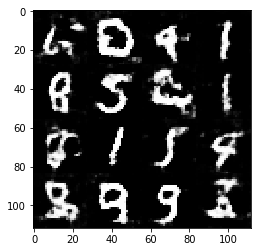

Epoch 1/2... Discriminator Loss: 1.3638... Generator Loss: 0.9165
Epoch 1/2... Discriminator Loss: 1.1461... Generator Loss: 0.9650
Epoch 1/2... Discriminator Loss: 1.3185... Generator Loss: 0.8474
Epoch 1/2... Discriminator Loss: 1.2061... Generator Loss: 0.9760
Epoch 1/2... Discriminator Loss: 1.3270... Generator Loss: 0.9307


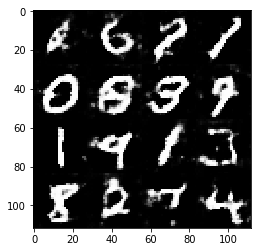

Epoch 1/2... Discriminator Loss: 1.2664... Generator Loss: 0.8278
Epoch 1/2... Discriminator Loss: 1.2855... Generator Loss: 0.8969
Epoch 1/2... Discriminator Loss: 1.3220... Generator Loss: 0.8165
Epoch 1/2... Discriminator Loss: 1.2906... Generator Loss: 0.9278
Epoch 1/2... Discriminator Loss: 1.2796... Generator Loss: 0.8658


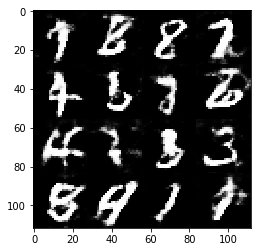

Epoch 1/2... Discriminator Loss: 1.3577... Generator Loss: 0.8506
Epoch 1/2... Discriminator Loss: 1.2273... Generator Loss: 0.9167
Epoch 1/2... Discriminator Loss: 1.3275... Generator Loss: 0.8457
Epoch 1/2... Discriminator Loss: 1.2508... Generator Loss: 0.8989
Epoch 1/2... Discriminator Loss: 1.3120... Generator Loss: 0.9112


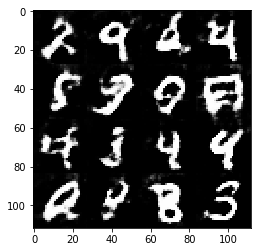

Epoch 1/2... Discriminator Loss: 1.2953... Generator Loss: 0.8793
Epoch 1/2... Discriminator Loss: 1.3513... Generator Loss: 0.8357
Epoch 1/2... Discriminator Loss: 1.2933... Generator Loss: 0.9190
Epoch 1/2... Discriminator Loss: 1.2723... Generator Loss: 0.8051
Epoch 1/2... Discriminator Loss: 1.3528... Generator Loss: 0.8465


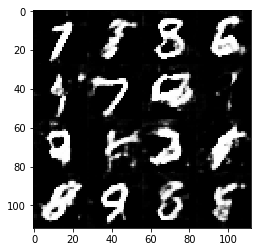

Epoch 1/2... Discriminator Loss: 1.1786... Generator Loss: 0.9770
Epoch 1/2... Discriminator Loss: 1.2145... Generator Loss: 0.8065
Epoch 1/2... Discriminator Loss: 1.2955... Generator Loss: 0.7583
Epoch 1/2... Discriminator Loss: 1.2647... Generator Loss: 0.8761
Epoch 1/2... Discriminator Loss: 1.2389... Generator Loss: 0.9673


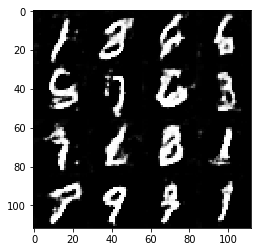

Epoch 1/2... Discriminator Loss: 1.2908... Generator Loss: 0.9912
Epoch 1/2... Discriminator Loss: 1.3255... Generator Loss: 0.8199
Epoch 1/2... Discriminator Loss: 1.2053... Generator Loss: 0.8420
Epoch 1/2... Discriminator Loss: 1.3095... Generator Loss: 0.9053
Epoch 1/2... Discriminator Loss: 1.3300... Generator Loss: 0.9015


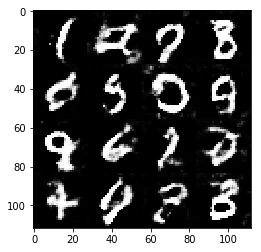

Epoch 1/2... Discriminator Loss: 1.2788... Generator Loss: 0.9493
Epoch 1/2... Discriminator Loss: 1.3508... Generator Loss: 0.8977
Epoch 1/2... Discriminator Loss: 1.3506... Generator Loss: 0.9448
Epoch 1/2... Discriminator Loss: 1.2226... Generator Loss: 0.7348
Epoch 1/2... Discriminator Loss: 1.3160... Generator Loss: 1.0159


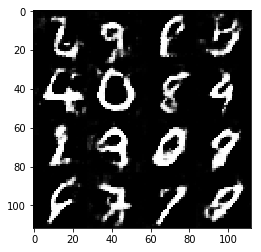

Epoch 1/2... Discriminator Loss: 1.2857... Generator Loss: 0.8646
Epoch 1/2... Discriminator Loss: 1.2685... Generator Loss: 0.8908
Epoch 1/2... Discriminator Loss: 1.3679... Generator Loss: 0.7993
Epoch 1/2... Discriminator Loss: 1.1559... Generator Loss: 0.9603
Epoch 1/2... Discriminator Loss: 1.2267... Generator Loss: 0.7948


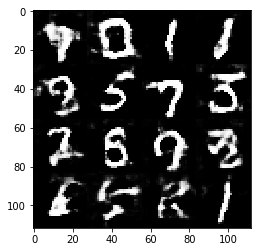

Epoch 1/2... Discriminator Loss: 1.2607... Generator Loss: 0.9586
Epoch 1/2... Discriminator Loss: 1.3224... Generator Loss: 0.7437
Epoch 1/2... Discriminator Loss: 1.2402... Generator Loss: 0.9554
Epoch 1/2... Discriminator Loss: 1.1713... Generator Loss: 1.1672
Epoch 1/2... Discriminator Loss: 1.3058... Generator Loss: 0.8984


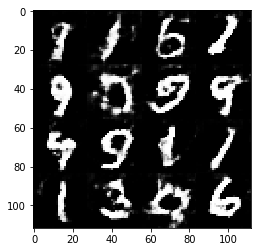

Epoch 1/2... Discriminator Loss: 1.2371... Generator Loss: 0.9130
Epoch 1/2... Discriminator Loss: 1.2545... Generator Loss: 0.8565
Epoch 1/2... Discriminator Loss: 1.1819... Generator Loss: 1.0517
Epoch 1/2... Discriminator Loss: 1.3483... Generator Loss: 0.6823
Epoch 1/2... Discriminator Loss: 1.2736... Generator Loss: 0.9035


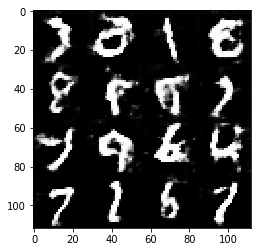

Epoch 1/2... Discriminator Loss: 1.3458... Generator Loss: 0.8420
Epoch 1/2... Discriminator Loss: 1.2257... Generator Loss: 0.8102
Epoch 1/2... Discriminator Loss: 1.2990... Generator Loss: 0.8287
Epoch 1/2... Discriminator Loss: 1.2511... Generator Loss: 0.7522
Epoch 1/2... Discriminator Loss: 1.2454... Generator Loss: 0.7596


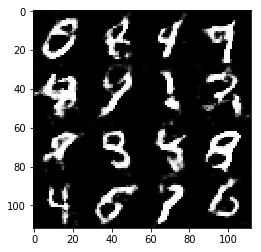

Epoch 1/2... Discriminator Loss: 1.3157... Generator Loss: 0.9996
Epoch 1/2... Discriminator Loss: 1.2989... Generator Loss: 0.8268
Epoch 1/2... Discriminator Loss: 1.2349... Generator Loss: 0.9250
Epoch 1/2... Discriminator Loss: 1.3370... Generator Loss: 0.9286
Epoch 1/2... Discriminator Loss: 1.2403... Generator Loss: 0.8499


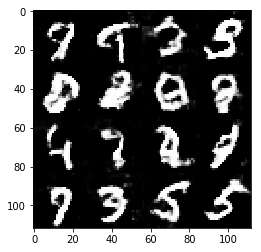

Epoch 1/2... Discriminator Loss: 1.2853... Generator Loss: 0.9723
Epoch 1/2... Discriminator Loss: 1.2856... Generator Loss: 0.8541
Epoch 1/2... Discriminator Loss: 1.2823... Generator Loss: 0.8239
Epoch 1/2... Discriminator Loss: 1.3104... Generator Loss: 0.9209
Epoch 1/2... Discriminator Loss: 1.2498... Generator Loss: 1.0441


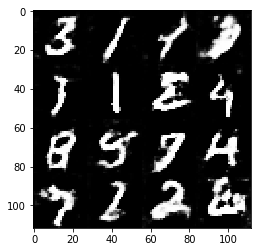

In [18]:
batch_size = 32
z_dim = 100
learning_rate = 0.0004
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 0/2... Discriminator Loss: 4.0187... Generator Loss: 0.0298
Epoch 0/2... Discriminator Loss: 0.5964... Generator Loss: 2.0332
Epoch 0/2... Discriminator Loss: 0.9204... Generator Loss: 0.9758
Epoch 0/2... Discriminator Loss: 0.6267... Generator Loss: 1.7581
Epoch 0/2... Discriminator Loss: 0.5956... Generator Loss: 6.4721


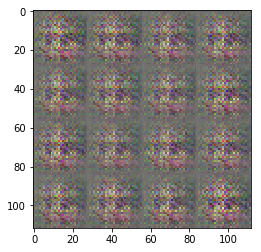

Epoch 0/2... Discriminator Loss: 1.2944... Generator Loss: 0.5921
Epoch 0/2... Discriminator Loss: 1.0723... Generator Loss: 0.8554
Epoch 0/2... Discriminator Loss: 1.3449... Generator Loss: 1.0454
Epoch 0/2... Discriminator Loss: 1.4590... Generator Loss: 2.6033
Epoch 0/2... Discriminator Loss: 1.0917... Generator Loss: 1.0275


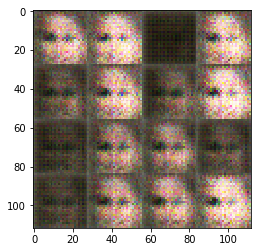

Epoch 0/2... Discriminator Loss: 1.0905... Generator Loss: 0.7978
Epoch 0/2... Discriminator Loss: 1.4262... Generator Loss: 0.6839
Epoch 0/2... Discriminator Loss: 1.0360... Generator Loss: 0.9700
Epoch 0/2... Discriminator Loss: 0.8867... Generator Loss: 2.2268
Epoch 0/2... Discriminator Loss: 1.0765... Generator Loss: 0.8345


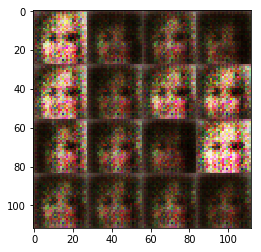

Epoch 0/2... Discriminator Loss: 1.1086... Generator Loss: 0.8753
Epoch 0/2... Discriminator Loss: 1.1433... Generator Loss: 0.7176
Epoch 0/2... Discriminator Loss: 1.2043... Generator Loss: 0.8158
Epoch 0/2... Discriminator Loss: 1.0089... Generator Loss: 1.0162
Epoch 0/2... Discriminator Loss: 1.4597... Generator Loss: 0.5177


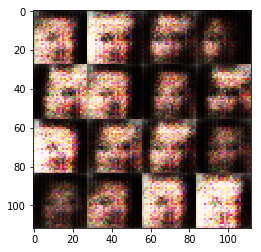

Epoch 0/2... Discriminator Loss: 0.9022... Generator Loss: 2.3522
Epoch 0/2... Discriminator Loss: 0.8678... Generator Loss: 1.4280
Epoch 0/2... Discriminator Loss: 1.1914... Generator Loss: 0.9351
Epoch 0/2... Discriminator Loss: 1.4221... Generator Loss: 0.5416
Epoch 0/2... Discriminator Loss: 1.3324... Generator Loss: 0.6643


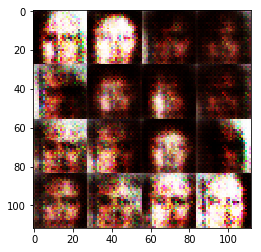

Epoch 0/2... Discriminator Loss: 0.8110... Generator Loss: 1.2105
Epoch 0/2... Discriminator Loss: 1.2944... Generator Loss: 0.7844
Epoch 0/2... Discriminator Loss: 2.2783... Generator Loss: 4.2316
Epoch 0/2... Discriminator Loss: 0.8741... Generator Loss: 0.9945
Epoch 0/2... Discriminator Loss: 1.0514... Generator Loss: 1.1475


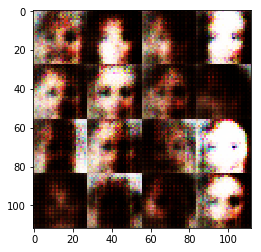

Epoch 0/2... Discriminator Loss: 0.5902... Generator Loss: 3.2362
Epoch 0/2... Discriminator Loss: 0.5413... Generator Loss: 4.3617
Epoch 0/2... Discriminator Loss: 0.7049... Generator Loss: 1.6688
Epoch 0/2... Discriminator Loss: 0.6024... Generator Loss: 2.3939
Epoch 0/2... Discriminator Loss: 0.8287... Generator Loss: 1.2779


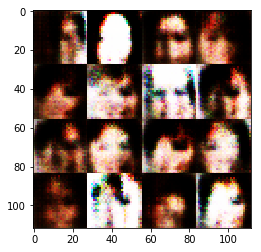

Epoch 0/2... Discriminator Loss: 0.8387... Generator Loss: 4.1271
Epoch 0/2... Discriminator Loss: 0.6993... Generator Loss: 4.3038
Epoch 0/2... Discriminator Loss: 0.4857... Generator Loss: 4.0336
Epoch 0/2... Discriminator Loss: 0.9499... Generator Loss: 5.1107
Epoch 0/2... Discriminator Loss: 0.4045... Generator Loss: 3.3449


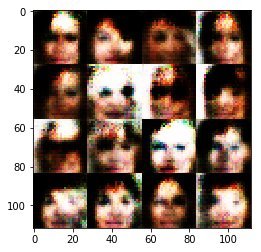

Epoch 0/2... Discriminator Loss: 0.6646... Generator Loss: 2.2610
Epoch 0/2... Discriminator Loss: 0.8483... Generator Loss: 2.7338
Epoch 0/2... Discriminator Loss: 0.4867... Generator Loss: 2.8378
Epoch 0/2... Discriminator Loss: 0.5123... Generator Loss: 2.8706
Epoch 0/2... Discriminator Loss: 0.4555... Generator Loss: 3.2500


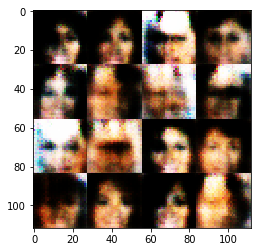

Epoch 0/2... Discriminator Loss: 0.4741... Generator Loss: 3.0348
Epoch 0/2... Discriminator Loss: 0.6464... Generator Loss: 2.9613
Epoch 0/2... Discriminator Loss: 0.8810... Generator Loss: 1.4537
Epoch 0/2... Discriminator Loss: 0.9166... Generator Loss: 1.1689
Epoch 0/2... Discriminator Loss: 0.6464... Generator Loss: 2.2126


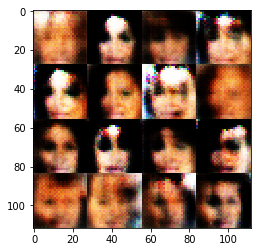

Epoch 0/2... Discriminator Loss: 0.5277... Generator Loss: 2.3336
Epoch 0/2... Discriminator Loss: 0.5360... Generator Loss: 3.0209
Epoch 0/2... Discriminator Loss: 0.6210... Generator Loss: 1.9315
Epoch 0/2... Discriminator Loss: 0.4830... Generator Loss: 2.4508
Epoch 0/2... Discriminator Loss: 0.6798... Generator Loss: 3.2392


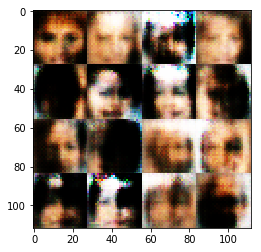

Epoch 0/2... Discriminator Loss: 0.4766... Generator Loss: 2.7978
Epoch 0/2... Discriminator Loss: 0.5290... Generator Loss: 2.5315
Epoch 0/2... Discriminator Loss: 0.6417... Generator Loss: 2.1826
Epoch 0/2... Discriminator Loss: 0.4869... Generator Loss: 5.1098
Epoch 0/2... Discriminator Loss: 1.2547... Generator Loss: 0.7620


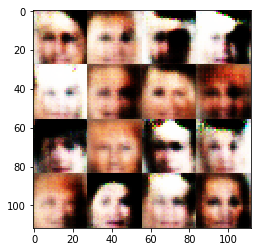

Epoch 0/2... Discriminator Loss: 0.9402... Generator Loss: 1.1420
Epoch 0/2... Discriminator Loss: 0.8833... Generator Loss: 1.0458
Epoch 0/2... Discriminator Loss: 0.7270... Generator Loss: 2.0423
Epoch 0/2... Discriminator Loss: 0.7197... Generator Loss: 1.5944
Epoch 0/2... Discriminator Loss: 0.7008... Generator Loss: 2.2478


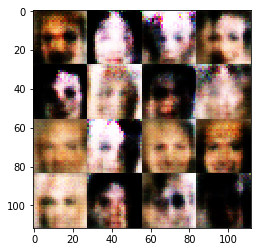

Epoch 0/2... Discriminator Loss: 0.4949... Generator Loss: 2.6609
Epoch 0/2... Discriminator Loss: 0.7014... Generator Loss: 2.7674
Epoch 0/2... Discriminator Loss: 0.5279... Generator Loss: 3.2604
Epoch 0/2... Discriminator Loss: 0.5344... Generator Loss: 1.9228
Epoch 0/2... Discriminator Loss: 0.4452... Generator Loss: 3.2142


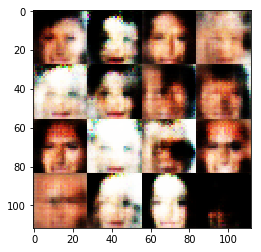

Epoch 0/2... Discriminator Loss: 0.4366... Generator Loss: 2.7363
Epoch 0/2... Discriminator Loss: 0.5082... Generator Loss: 2.4530
Epoch 0/2... Discriminator Loss: 0.4281... Generator Loss: 3.5441
Epoch 0/2... Discriminator Loss: 0.4098... Generator Loss: 3.3670
Epoch 0/2... Discriminator Loss: 0.7065... Generator Loss: 2.8282


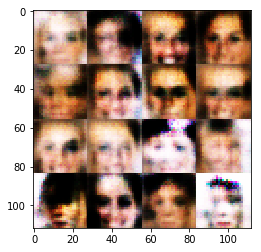

Epoch 0/2... Discriminator Loss: 0.3623... Generator Loss: 4.7691
Epoch 0/2... Discriminator Loss: 0.4148... Generator Loss: 4.3161
Epoch 0/2... Discriminator Loss: 1.7064... Generator Loss: 0.8457
Epoch 0/2... Discriminator Loss: 1.1593... Generator Loss: 1.7472
Epoch 0/2... Discriminator Loss: 1.0692... Generator Loss: 0.9623


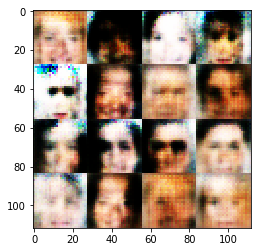

Epoch 0/2... Discriminator Loss: 1.2111... Generator Loss: 2.6193
Epoch 0/2... Discriminator Loss: 1.1421... Generator Loss: 0.7555
Epoch 0/2... Discriminator Loss: 1.0665... Generator Loss: 1.5129
Epoch 0/2... Discriminator Loss: 0.8956... Generator Loss: 1.4146
Epoch 0/2... Discriminator Loss: 0.9263... Generator Loss: 1.0949


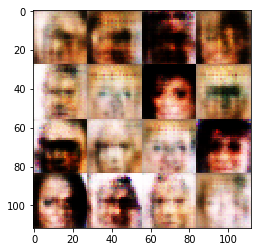

Epoch 0/2... Discriminator Loss: 0.9656... Generator Loss: 1.0073
Epoch 0/2... Discriminator Loss: 0.7631... Generator Loss: 1.4021
Epoch 0/2... Discriminator Loss: 1.4414... Generator Loss: 2.8428
Epoch 0/2... Discriminator Loss: 0.9131... Generator Loss: 3.4846
Epoch 0/2... Discriminator Loss: 0.5523... Generator Loss: 2.1110


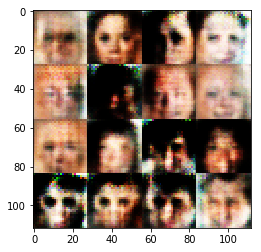

Epoch 0/2... Discriminator Loss: 0.6842... Generator Loss: 3.4319
Epoch 0/2... Discriminator Loss: 0.6751... Generator Loss: 1.8192
Epoch 0/2... Discriminator Loss: 0.4763... Generator Loss: 2.6804
Epoch 0/2... Discriminator Loss: 0.5436... Generator Loss: 2.1213
Epoch 0/2... Discriminator Loss: 0.5061... Generator Loss: 2.6618


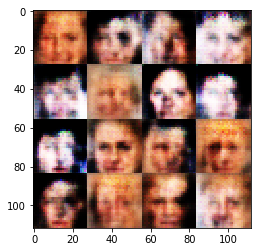

Epoch 0/2... Discriminator Loss: 0.4085... Generator Loss: 3.5451
Epoch 0/2... Discriminator Loss: 1.4178... Generator Loss: 0.7802
Epoch 0/2... Discriminator Loss: 1.0018... Generator Loss: 1.4491
Epoch 0/2... Discriminator Loss: 0.9113... Generator Loss: 1.8902
Epoch 0/2... Discriminator Loss: 0.6973... Generator Loss: 2.0006


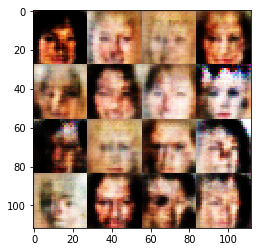

Epoch 0/2... Discriminator Loss: 0.8621... Generator Loss: 1.0421
Epoch 0/2... Discriminator Loss: 0.6433... Generator Loss: 1.7900
Epoch 0/2... Discriminator Loss: 0.9578... Generator Loss: 3.9983
Epoch 0/2... Discriminator Loss: 0.4170... Generator Loss: 3.5986
Epoch 0/2... Discriminator Loss: 0.5611... Generator Loss: 2.3579


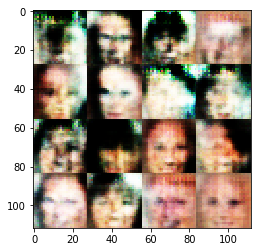

Epoch 0/2... Discriminator Loss: 0.4536... Generator Loss: 2.8517
Epoch 0/2... Discriminator Loss: 0.4065... Generator Loss: 2.8915
Epoch 0/2... Discriminator Loss: 0.4870... Generator Loss: 2.7655
Epoch 0/2... Discriminator Loss: 0.4212... Generator Loss: 2.9461
Epoch 0/2... Discriminator Loss: 0.3611... Generator Loss: 4.5325


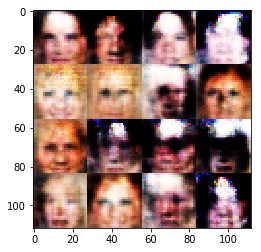

Epoch 0/2... Discriminator Loss: 0.3703... Generator Loss: 4.4938
Epoch 0/2... Discriminator Loss: 0.4255... Generator Loss: 4.6074
Epoch 0/2... Discriminator Loss: 0.4205... Generator Loss: 3.5881
Epoch 0/2... Discriminator Loss: 0.3962... Generator Loss: 4.5686
Epoch 0/2... Discriminator Loss: 0.3577... Generator Loss: 4.9782


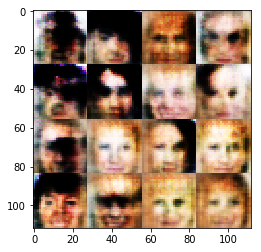

Epoch 0/2... Discriminator Loss: 0.4032... Generator Loss: 3.9217
Epoch 0/2... Discriminator Loss: 0.4017... Generator Loss: 3.3868
Epoch 0/2... Discriminator Loss: 0.9314... Generator Loss: 1.7990
Epoch 0/2... Discriminator Loss: 0.9288... Generator Loss: 1.1127
Epoch 0/2... Discriminator Loss: 0.7674... Generator Loss: 1.6228


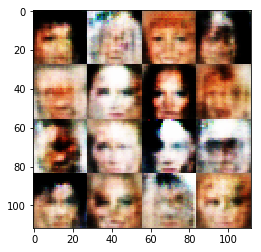

Epoch 0/2... Discriminator Loss: 0.9650... Generator Loss: 3.3578
Epoch 0/2... Discriminator Loss: 0.6319... Generator Loss: 2.3535
Epoch 0/2... Discriminator Loss: 0.4501... Generator Loss: 2.7533
Epoch 0/2... Discriminator Loss: 0.4501... Generator Loss: 2.9296
Epoch 0/2... Discriminator Loss: 0.6648... Generator Loss: 3.9190


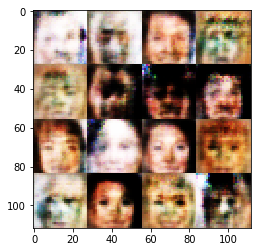

Epoch 0/2... Discriminator Loss: 0.4087... Generator Loss: 3.6531
Epoch 0/2... Discriminator Loss: 1.4754... Generator Loss: 0.6053
Epoch 0/2... Discriminator Loss: 0.5573... Generator Loss: 2.7047
Epoch 0/2... Discriminator Loss: 0.5083... Generator Loss: 3.1791
Epoch 0/2... Discriminator Loss: 0.5715... Generator Loss: 2.3787


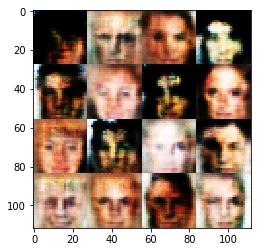

Epoch 0/2... Discriminator Loss: 0.4666... Generator Loss: 2.7636
Epoch 0/2... Discriminator Loss: 0.3780... Generator Loss: 3.9224
Epoch 0/2... Discriminator Loss: 0.4278... Generator Loss: 5.0377
Epoch 0/2... Discriminator Loss: 0.3715... Generator Loss: 4.9029
Epoch 0/2... Discriminator Loss: 0.8652... Generator Loss: 0.9651


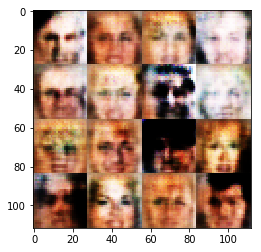

Epoch 0/2... Discriminator Loss: 0.4044... Generator Loss: 3.6541
Epoch 0/2... Discriminator Loss: 0.4413... Generator Loss: 2.9529
Epoch 0/2... Discriminator Loss: 0.8121... Generator Loss: 1.1469
Epoch 0/2... Discriminator Loss: 0.4920... Generator Loss: 2.9788
Epoch 0/2... Discriminator Loss: 0.3865... Generator Loss: 4.0948


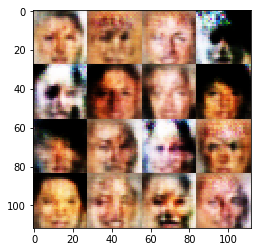

Epoch 0/2... Discriminator Loss: 0.4603... Generator Loss: 2.8895
Epoch 0/2... Discriminator Loss: 0.4893... Generator Loss: 3.5367
Epoch 0/2... Discriminator Loss: 0.3704... Generator Loss: 4.9064
Epoch 0/2... Discriminator Loss: 0.4441... Generator Loss: 3.3340
Epoch 0/2... Discriminator Loss: 0.4206... Generator Loss: 3.0053


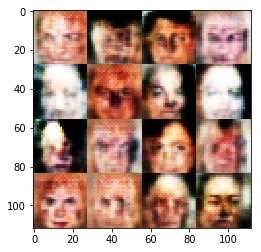

Epoch 0/2... Discriminator Loss: 0.5119... Generator Loss: 2.2938
Epoch 0/2... Discriminator Loss: 0.3669... Generator Loss: 4.3478
Epoch 0/2... Discriminator Loss: 2.5555... Generator Loss: 0.5157
Epoch 0/2... Discriminator Loss: 0.5096... Generator Loss: 2.7781
Epoch 0/2... Discriminator Loss: 2.7351... Generator Loss: 5.4682


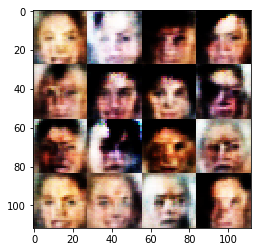

Epoch 0/2... Discriminator Loss: 0.6619... Generator Loss: 2.1561
Epoch 0/2... Discriminator Loss: 0.4943... Generator Loss: 2.3152
Epoch 0/2... Discriminator Loss: 0.4873... Generator Loss: 2.7904
Epoch 0/2... Discriminator Loss: 0.4153... Generator Loss: 3.7988
Epoch 0/2... Discriminator Loss: 0.4310... Generator Loss: 3.0823


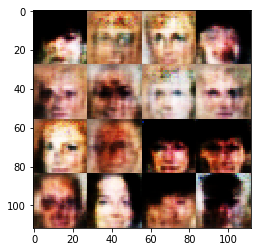

Epoch 0/2... Discriminator Loss: 0.6590... Generator Loss: 1.8509
Epoch 0/2... Discriminator Loss: 0.6137... Generator Loss: 2.9396
Epoch 0/2... Discriminator Loss: 0.3590... Generator Loss: 4.5515
Epoch 0/2... Discriminator Loss: 0.5737... Generator Loss: 2.5954
Epoch 0/2... Discriminator Loss: 0.4423... Generator Loss: 2.5481


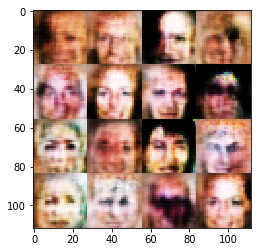

Epoch 0/2... Discriminator Loss: 0.4688... Generator Loss: 2.5115
Epoch 0/2... Discriminator Loss: 0.9588... Generator Loss: 3.4855
Epoch 0/2... Discriminator Loss: 1.0598... Generator Loss: 0.8273
Epoch 0/2... Discriminator Loss: 0.6452... Generator Loss: 2.0698
Epoch 0/2... Discriminator Loss: 0.8086... Generator Loss: 1.3890


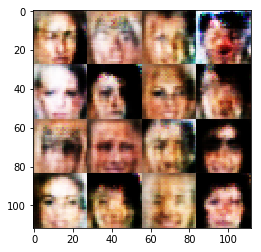

Epoch 0/2... Discriminator Loss: 0.6927... Generator Loss: 2.0664
Epoch 0/2... Discriminator Loss: 0.8895... Generator Loss: 1.2644
Epoch 0/2... Discriminator Loss: 0.6547... Generator Loss: 3.1420
Epoch 0/2... Discriminator Loss: 0.5872... Generator Loss: 1.7287
Epoch 0/2... Discriminator Loss: 0.5977... Generator Loss: 2.3362


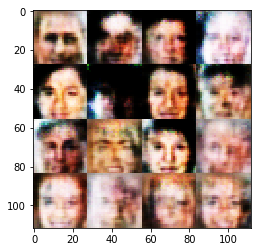

Epoch 0/2... Discriminator Loss: 0.7528... Generator Loss: 2.6474
Epoch 0/2... Discriminator Loss: 0.5318... Generator Loss: 2.6484
Epoch 0/2... Discriminator Loss: 0.5373... Generator Loss: 2.3898
Epoch 0/2... Discriminator Loss: 0.4688... Generator Loss: 2.6010
Epoch 0/2... Discriminator Loss: 0.5441... Generator Loss: 3.8300


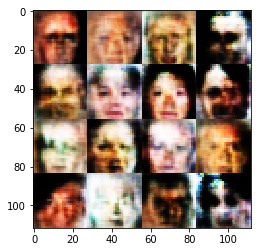

Epoch 0/2... Discriminator Loss: 2.1765... Generator Loss: 4.2205
Epoch 0/2... Discriminator Loss: 0.5433... Generator Loss: 2.3900
Epoch 0/2... Discriminator Loss: 0.6059... Generator Loss: 2.0517
Epoch 0/2... Discriminator Loss: 0.4733... Generator Loss: 1.8975
Epoch 0/2... Discriminator Loss: 0.4919... Generator Loss: 2.1761


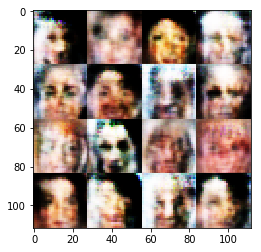

Epoch 0/2... Discriminator Loss: 0.4970... Generator Loss: 3.8681
Epoch 0/2... Discriminator Loss: 0.4193... Generator Loss: 3.8911
Epoch 0/2... Discriminator Loss: 0.6360... Generator Loss: 3.4593
Epoch 0/2... Discriminator Loss: 0.6272... Generator Loss: 3.9958
Epoch 0/2... Discriminator Loss: 0.4665... Generator Loss: 3.1943


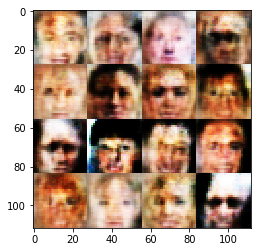

Epoch 0/2... Discriminator Loss: 0.4071... Generator Loss: 3.1084
Epoch 0/2... Discriminator Loss: 0.3833... Generator Loss: 3.7620
Epoch 0/2... Discriminator Loss: 0.5507... Generator Loss: 2.1409
Epoch 0/2... Discriminator Loss: 0.6863... Generator Loss: 1.4173
Epoch 0/2... Discriminator Loss: 0.8603... Generator Loss: 1.1614


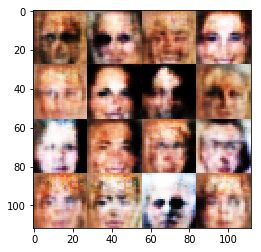

Epoch 0/2... Discriminator Loss: 0.9468... Generator Loss: 1.4920
Epoch 0/2... Discriminator Loss: 0.4004... Generator Loss: 3.5908
Epoch 0/2... Discriminator Loss: 0.4640... Generator Loss: 2.4021
Epoch 0/2... Discriminator Loss: 0.5508... Generator Loss: 1.7342
Epoch 0/2... Discriminator Loss: 1.0506... Generator Loss: 1.0998


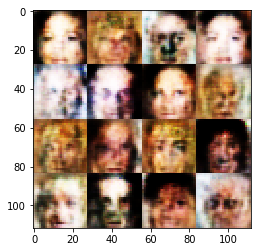

Epoch 0/2... Discriminator Loss: 0.9740... Generator Loss: 2.9783
Epoch 0/2... Discriminator Loss: 0.7036... Generator Loss: 1.6525
Epoch 0/2... Discriminator Loss: 0.3997... Generator Loss: 3.6589
Epoch 0/2... Discriminator Loss: 0.4215... Generator Loss: 3.5958
Epoch 0/2... Discriminator Loss: 0.3983... Generator Loss: 3.9064


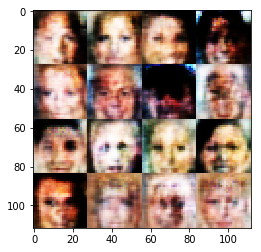

Epoch 0/2... Discriminator Loss: 0.6127... Generator Loss: 1.2716
Epoch 0/2... Discriminator Loss: 0.3811... Generator Loss: 6.0787
Epoch 0/2... Discriminator Loss: 0.3936... Generator Loss: 4.7298
Epoch 0/2... Discriminator Loss: 0.4551... Generator Loss: 3.0452
Epoch 0/2... Discriminator Loss: 1.0387... Generator Loss: 0.8733


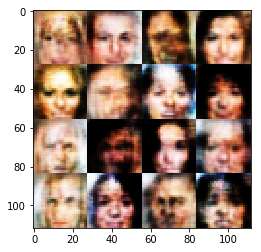

Epoch 0/2... Discriminator Loss: 0.5075... Generator Loss: 2.6487
Epoch 0/2... Discriminator Loss: 0.4294... Generator Loss: 3.0841
Epoch 0/2... Discriminator Loss: 0.7149... Generator Loss: 3.5460
Epoch 0/2... Discriminator Loss: 0.4257... Generator Loss: 3.3563
Epoch 0/2... Discriminator Loss: 1.5050... Generator Loss: 2.4333


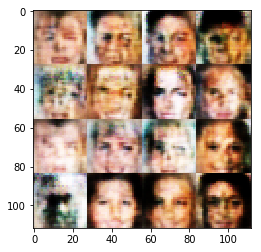

Epoch 0/2... Discriminator Loss: 0.7109... Generator Loss: 1.5618
Epoch 0/2... Discriminator Loss: 0.7083... Generator Loss: 1.9740
Epoch 0/2... Discriminator Loss: 0.4775... Generator Loss: 2.0962
Epoch 0/2... Discriminator Loss: 1.0493... Generator Loss: 3.3346
Epoch 0/2... Discriminator Loss: 0.4806... Generator Loss: 2.6453


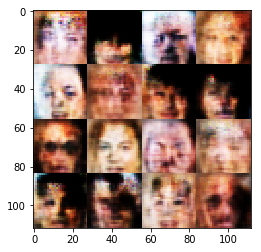

Epoch 0/2... Discriminator Loss: 0.3732... Generator Loss: 4.0035
Epoch 0/2... Discriminator Loss: 0.3960... Generator Loss: 3.5710
Epoch 0/2... Discriminator Loss: 0.3692... Generator Loss: 5.1982
Epoch 0/2... Discriminator Loss: 1.5110... Generator Loss: 3.2472
Epoch 0/2... Discriminator Loss: 1.0647... Generator Loss: 1.1489


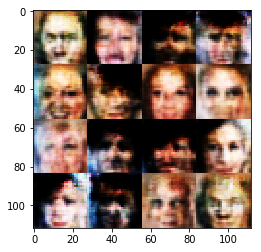

Epoch 0/2... Discriminator Loss: 0.7317... Generator Loss: 1.5081
Epoch 0/2... Discriminator Loss: 1.6016... Generator Loss: 0.4758
Epoch 0/2... Discriminator Loss: 0.6056... Generator Loss: 3.0556
Epoch 0/2... Discriminator Loss: 0.6522... Generator Loss: 1.1797
Epoch 0/2... Discriminator Loss: 0.7187... Generator Loss: 1.4249


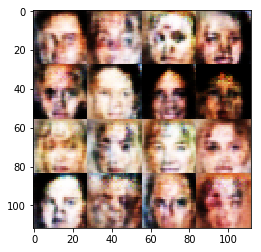

Epoch 0/2... Discriminator Loss: 0.6158... Generator Loss: 4.4553
Epoch 0/2... Discriminator Loss: 1.0764... Generator Loss: 1.1984
Epoch 0/2... Discriminator Loss: 0.9071... Generator Loss: 3.4782
Epoch 0/2... Discriminator Loss: 1.3717... Generator Loss: 3.0863
Epoch 0/2... Discriminator Loss: 0.6162... Generator Loss: 2.1109


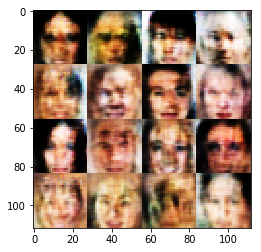

Epoch 0/2... Discriminator Loss: 0.4133... Generator Loss: 3.0966
Epoch 0/2... Discriminator Loss: 0.5129... Generator Loss: 2.4186
Epoch 0/2... Discriminator Loss: 0.5569... Generator Loss: 2.8099
Epoch 0/2... Discriminator Loss: 0.7864... Generator Loss: 1.0266
Epoch 0/2... Discriminator Loss: 0.4959... Generator Loss: 2.4363


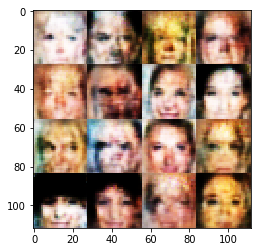

Epoch 0/2... Discriminator Loss: 0.5196... Generator Loss: 1.7915
Epoch 0/2... Discriminator Loss: 0.5048... Generator Loss: 2.4118
Epoch 0/2... Discriminator Loss: 0.4815... Generator Loss: 2.7964
Epoch 0/2... Discriminator Loss: 0.3718... Generator Loss: 3.8475
Epoch 0/2... Discriminator Loss: 0.5117... Generator Loss: 4.0323


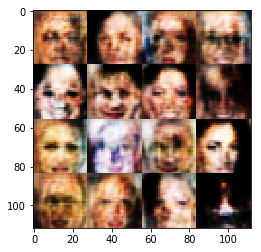

Epoch 0/2... Discriminator Loss: 1.1042... Generator Loss: 1.1834
Epoch 0/2... Discriminator Loss: 0.4706... Generator Loss: 3.2796
Epoch 0/2... Discriminator Loss: 0.4044... Generator Loss: 3.5545
Epoch 0/2... Discriminator Loss: 0.8933... Generator Loss: 4.9218
Epoch 0/2... Discriminator Loss: 0.4263... Generator Loss: 3.1132


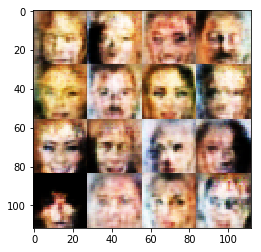

Epoch 0/2... Discriminator Loss: 0.4706... Generator Loss: 3.0270
Epoch 0/2... Discriminator Loss: 0.8952... Generator Loss: 6.7311
Epoch 0/2... Discriminator Loss: 0.6461... Generator Loss: 2.0620
Epoch 0/2... Discriminator Loss: 1.0832... Generator Loss: 1.1842
Epoch 0/2... Discriminator Loss: 0.4845... Generator Loss: 2.4497


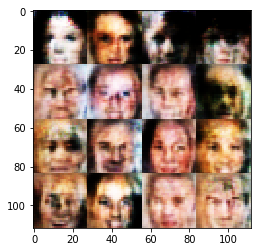

Epoch 0/2... Discriminator Loss: 0.5313... Generator Loss: 2.2576
Epoch 0/2... Discriminator Loss: 0.6682... Generator Loss: 1.4496
Epoch 0/2... Discriminator Loss: 0.5011... Generator Loss: 2.4016
Epoch 0/2... Discriminator Loss: 0.5915... Generator Loss: 3.8589
Epoch 0/2... Discriminator Loss: 0.8318... Generator Loss: 1.8750


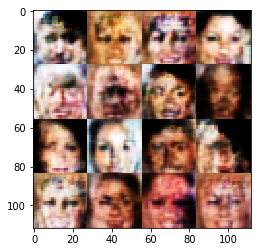

Epoch 0/2... Discriminator Loss: 0.4474... Generator Loss: 3.3006
Epoch 0/2... Discriminator Loss: 0.4580... Generator Loss: 2.9995
Epoch 0/2... Discriminator Loss: 0.3768... Generator Loss: 4.7088
Epoch 0/2... Discriminator Loss: 0.4713... Generator Loss: 2.2763
Epoch 0/2... Discriminator Loss: 0.5021... Generator Loss: 2.2650


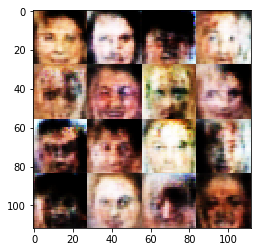

Epoch 0/2... Discriminator Loss: 0.4137... Generator Loss: 3.1078
Epoch 0/2... Discriminator Loss: 0.8147... Generator Loss: 1.1771
Epoch 0/2... Discriminator Loss: 0.4415... Generator Loss: 2.7837
Epoch 0/2... Discriminator Loss: 0.5911... Generator Loss: 2.9021
Epoch 0/2... Discriminator Loss: 0.6409... Generator Loss: 1.8165


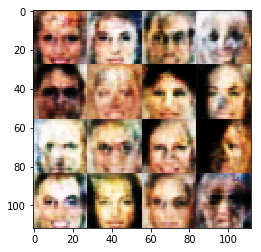

Epoch 0/2... Discriminator Loss: 0.7083... Generator Loss: 1.4724
Epoch 0/2... Discriminator Loss: 0.6557... Generator Loss: 2.5390
Epoch 0/2... Discriminator Loss: 1.4847... Generator Loss: 0.4014
Epoch 0/2... Discriminator Loss: 0.3979... Generator Loss: 4.3930
Epoch 0/2... Discriminator Loss: 1.0770... Generator Loss: 1.1602


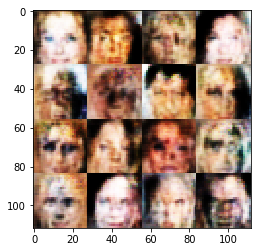

Epoch 0/2... Discriminator Loss: 1.2353... Generator Loss: 3.2656
Epoch 0/2... Discriminator Loss: 0.4561... Generator Loss: 2.8298
Epoch 0/2... Discriminator Loss: 0.9230... Generator Loss: 1.4910
Epoch 0/2... Discriminator Loss: 0.7914... Generator Loss: 2.5196
Epoch 0/2... Discriminator Loss: 0.5196... Generator Loss: 3.4314


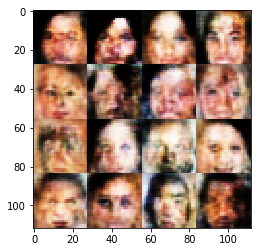

Epoch 0/2... Discriminator Loss: 0.5597... Generator Loss: 2.6592
Epoch 0/2... Discriminator Loss: 0.5613... Generator Loss: 1.7256
Epoch 0/2... Discriminator Loss: 0.5543... Generator Loss: 1.8742
Epoch 0/2... Discriminator Loss: 0.6680... Generator Loss: 1.6279
Epoch 0/2... Discriminator Loss: 0.5487... Generator Loss: 2.9176


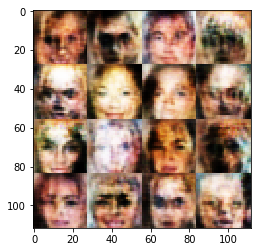

Epoch 0/2... Discriminator Loss: 0.4256... Generator Loss: 3.6541
Epoch 0/2... Discriminator Loss: 0.8240... Generator Loss: 4.9706
Epoch 0/2... Discriminator Loss: 0.6597... Generator Loss: 1.9454
Epoch 0/2... Discriminator Loss: 0.6526... Generator Loss: 2.3462
Epoch 0/2... Discriminator Loss: 0.8181... Generator Loss: 4.1270


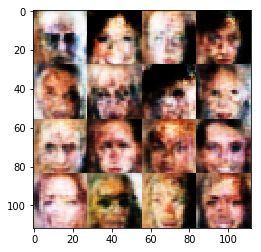

Epoch 0/2... Discriminator Loss: 0.6281... Generator Loss: 2.2285
Epoch 0/2... Discriminator Loss: 0.5133... Generator Loss: 3.2938
Epoch 0/2... Discriminator Loss: 0.5410... Generator Loss: 2.1951
Epoch 0/2... Discriminator Loss: 0.4111... Generator Loss: 4.8095
Epoch 0/2... Discriminator Loss: 1.7526... Generator Loss: 3.1090


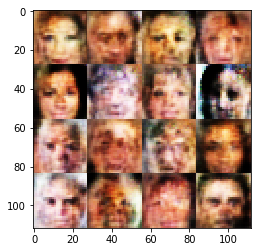

Epoch 0/2... Discriminator Loss: 0.4928... Generator Loss: 2.3123
Epoch 0/2... Discriminator Loss: 0.5174... Generator Loss: 2.7064
Epoch 0/2... Discriminator Loss: 0.7998... Generator Loss: 1.5228
Epoch 0/2... Discriminator Loss: 0.4635... Generator Loss: 2.5623
Epoch 0/2... Discriminator Loss: 0.6340... Generator Loss: 3.6941


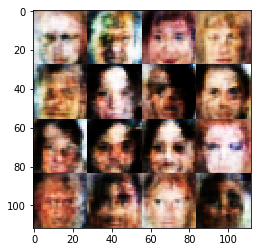

Epoch 0/2... Discriminator Loss: 1.3002... Generator Loss: 1.7993
Epoch 0/2... Discriminator Loss: 0.4414... Generator Loss: 3.1449
Epoch 0/2... Discriminator Loss: 0.5304... Generator Loss: 2.0185
Epoch 0/2... Discriminator Loss: 0.4099... Generator Loss: 3.2663
Epoch 0/2... Discriminator Loss: 0.6427... Generator Loss: 2.1352


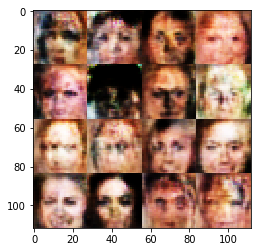

Epoch 0/2... Discriminator Loss: 1.0278... Generator Loss: 4.1324
Epoch 0/2... Discriminator Loss: 0.5528... Generator Loss: 2.7864
Epoch 0/2... Discriminator Loss: 1.5498... Generator Loss: 3.6501
Epoch 0/2... Discriminator Loss: 1.1672... Generator Loss: 1.2699
Epoch 0/2... Discriminator Loss: 0.4279... Generator Loss: 4.1794


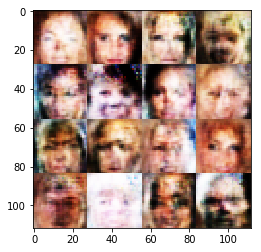

Epoch 0/2... Discriminator Loss: 0.4286... Generator Loss: 2.8417
Epoch 0/2... Discriminator Loss: 0.4252... Generator Loss: 3.4512
Epoch 0/2... Discriminator Loss: 0.6463... Generator Loss: 1.8109
Epoch 0/2... Discriminator Loss: 0.6504... Generator Loss: 4.5853
Epoch 0/2... Discriminator Loss: 0.3909... Generator Loss: 3.9468


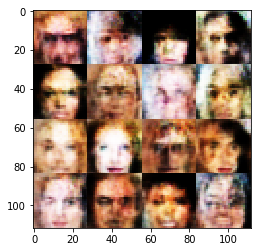

Epoch 0/2... Discriminator Loss: 0.7007... Generator Loss: 1.9243
Epoch 0/2... Discriminator Loss: 0.8006... Generator Loss: 3.1318
Epoch 0/2... Discriminator Loss: 0.6151... Generator Loss: 2.4088
Epoch 0/2... Discriminator Loss: 0.4832... Generator Loss: 2.0614
Epoch 0/2... Discriminator Loss: 0.7733... Generator Loss: 1.2419


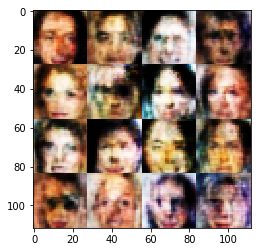

Epoch 0/2... Discriminator Loss: 1.0763... Generator Loss: 4.0420
Epoch 0/2... Discriminator Loss: 0.5169... Generator Loss: 2.0906
Epoch 0/2... Discriminator Loss: 1.2710... Generator Loss: 0.7035
Epoch 0/2... Discriminator Loss: 0.6240... Generator Loss: 2.7664
Epoch 0/2... Discriminator Loss: 0.5958... Generator Loss: 1.8447


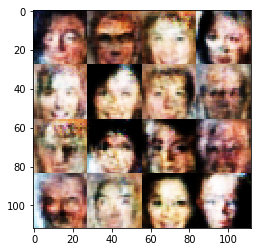

Epoch 0/2... Discriminator Loss: 0.4483... Generator Loss: 3.0796
Epoch 0/2... Discriminator Loss: 0.5736... Generator Loss: 2.2499
Epoch 0/2... Discriminator Loss: 0.4549... Generator Loss: 3.0683
Epoch 0/2... Discriminator Loss: 0.5455... Generator Loss: 3.2585
Epoch 0/2... Discriminator Loss: 0.4952... Generator Loss: 2.3385


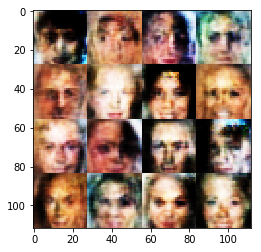

Epoch 0/2... Discriminator Loss: 0.4777... Generator Loss: 3.6864
Epoch 0/2... Discriminator Loss: 0.9468... Generator Loss: 1.0532
Epoch 0/2... Discriminator Loss: 0.5162... Generator Loss: 2.2019
Epoch 0/2... Discriminator Loss: 0.4190... Generator Loss: 3.6805
Epoch 0/2... Discriminator Loss: 0.3778... Generator Loss: 4.4346


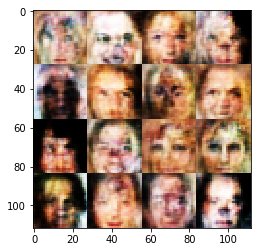

Epoch 0/2... Discriminator Loss: 0.7003... Generator Loss: 1.9691
Epoch 0/2... Discriminator Loss: 0.5568... Generator Loss: 2.2863
Epoch 0/2... Discriminator Loss: 0.4772... Generator Loss: 2.7139
Epoch 0/2... Discriminator Loss: 1.1760... Generator Loss: 0.6882
Epoch 0/2... Discriminator Loss: 0.6429... Generator Loss: 2.0933


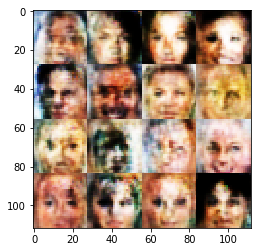

Epoch 0/2... Discriminator Loss: 0.3981... Generator Loss: 3.4276
Epoch 0/2... Discriminator Loss: 1.1250... Generator Loss: 4.0870
Epoch 0/2... Discriminator Loss: 0.3947... Generator Loss: 4.9825
Epoch 0/2... Discriminator Loss: 0.5749... Generator Loss: 2.8507
Epoch 0/2... Discriminator Loss: 0.7741... Generator Loss: 1.1942


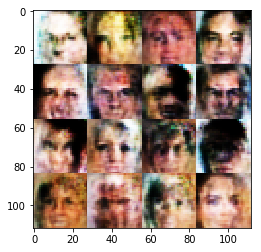

Epoch 0/2... Discriminator Loss: 0.4995... Generator Loss: 2.5551
Epoch 0/2... Discriminator Loss: 2.6357... Generator Loss: 3.8536
Epoch 0/2... Discriminator Loss: 0.9218... Generator Loss: 2.6660
Epoch 0/2... Discriminator Loss: 0.5397... Generator Loss: 1.8374
Epoch 0/2... Discriminator Loss: 0.5984... Generator Loss: 2.3617


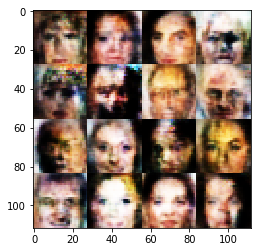

Epoch 0/2... Discriminator Loss: 0.6608... Generator Loss: 1.6793
Epoch 0/2... Discriminator Loss: 0.6950... Generator Loss: 1.1239
Epoch 0/2... Discriminator Loss: 0.6441... Generator Loss: 1.8012
Epoch 0/2... Discriminator Loss: 0.4490... Generator Loss: 2.9543
Epoch 0/2... Discriminator Loss: 0.4096... Generator Loss: 3.0572


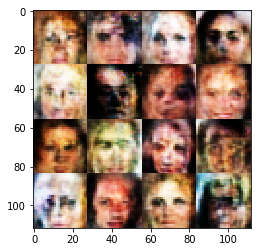

Epoch 0/2... Discriminator Loss: 0.4844... Generator Loss: 2.5674
Epoch 0/2... Discriminator Loss: 1.0263... Generator Loss: 1.0594
Epoch 0/2... Discriminator Loss: 0.4639... Generator Loss: 3.4264
Epoch 0/2... Discriminator Loss: 0.6553... Generator Loss: 2.0150
Epoch 0/2... Discriminator Loss: 0.5977... Generator Loss: 2.0684


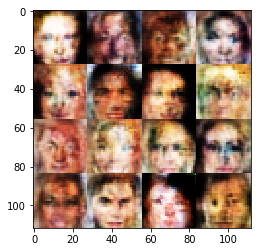

Epoch 0/2... Discriminator Loss: 0.6317... Generator Loss: 2.4301
Epoch 0/2... Discriminator Loss: 1.8758... Generator Loss: 3.3117
Epoch 0/2... Discriminator Loss: 0.5172... Generator Loss: 2.6759
Epoch 0/2... Discriminator Loss: 0.5181... Generator Loss: 2.3113
Epoch 0/2... Discriminator Loss: 0.8030... Generator Loss: 0.9917


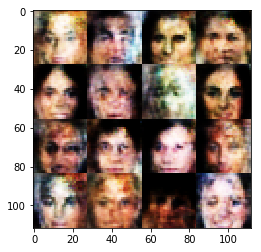

Epoch 0/2... Discriminator Loss: 0.4744... Generator Loss: 3.4549
Epoch 0/2... Discriminator Loss: 0.5714... Generator Loss: 2.2387
Epoch 0/2... Discriminator Loss: 0.5616... Generator Loss: 2.2247
Epoch 0/2... Discriminator Loss: 0.6692... Generator Loss: 1.7772
Epoch 0/2... Discriminator Loss: 0.7734... Generator Loss: 0.9871


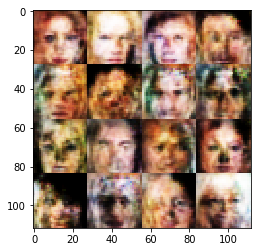

Epoch 0/2... Discriminator Loss: 0.5963... Generator Loss: 2.6361
Epoch 0/2... Discriminator Loss: 0.4754... Generator Loss: 2.5645
Epoch 0/2... Discriminator Loss: 0.5518... Generator Loss: 3.0959
Epoch 0/2... Discriminator Loss: 0.4228... Generator Loss: 2.9343
Epoch 0/2... Discriminator Loss: 0.4173... Generator Loss: 3.3953


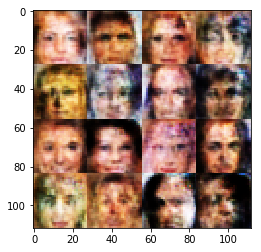

Epoch 0/2... Discriminator Loss: 0.4474... Generator Loss: 3.1128
Epoch 0/2... Discriminator Loss: 0.6960... Generator Loss: 1.2161
Epoch 0/2... Discriminator Loss: 0.4429... Generator Loss: 2.7437
Epoch 0/2... Discriminator Loss: 0.5747... Generator Loss: 2.1325
Epoch 0/2... Discriminator Loss: 0.9974... Generator Loss: 0.8672


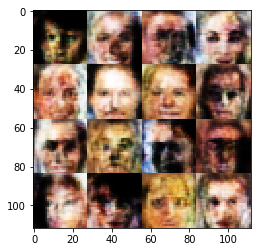

Epoch 0/2... Discriminator Loss: 1.4013... Generator Loss: 3.9102
Epoch 0/2... Discriminator Loss: 0.6594... Generator Loss: 2.8187
Epoch 0/2... Discriminator Loss: 0.4374... Generator Loss: 3.4581
Epoch 0/2... Discriminator Loss: 0.8485... Generator Loss: 0.7649
Epoch 0/2... Discriminator Loss: 0.4822... Generator Loss: 2.7939


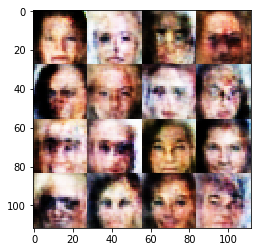

Epoch 0/2... Discriminator Loss: 0.5470... Generator Loss: 2.8542
Epoch 0/2... Discriminator Loss: 0.5208... Generator Loss: 3.1453
Epoch 0/2... Discriminator Loss: 0.7574... Generator Loss: 1.4615
Epoch 0/2... Discriminator Loss: 0.8848... Generator Loss: 1.0049
Epoch 0/2... Discriminator Loss: 0.7182... Generator Loss: 1.9712


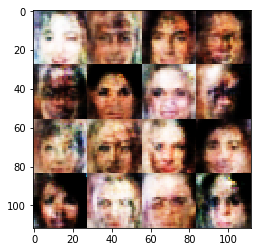

Epoch 0/2... Discriminator Loss: 0.5174... Generator Loss: 2.1194
Epoch 0/2... Discriminator Loss: 0.5929... Generator Loss: 2.2957
Epoch 0/2... Discriminator Loss: 0.6180... Generator Loss: 2.1375
Epoch 0/2... Discriminator Loss: 0.4431... Generator Loss: 5.0113
Epoch 0/2... Discriminator Loss: 0.5862... Generator Loss: 2.5418


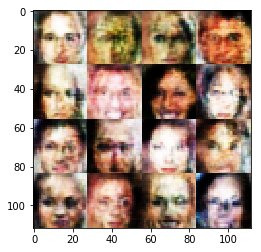

Epoch 0/2... Discriminator Loss: 0.6181... Generator Loss: 1.8232
Epoch 0/2... Discriminator Loss: 0.7755... Generator Loss: 2.1159
Epoch 0/2... Discriminator Loss: 0.3913... Generator Loss: 4.6464
Epoch 0/2... Discriminator Loss: 0.4875... Generator Loss: 3.5111
Epoch 0/2... Discriminator Loss: 0.6501... Generator Loss: 4.2272


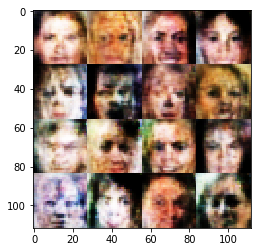

Epoch 0/2... Discriminator Loss: 0.7061... Generator Loss: 2.7870
Epoch 0/2... Discriminator Loss: 0.4951... Generator Loss: 2.3944
Epoch 0/2... Discriminator Loss: 0.4506... Generator Loss: 3.1599
Epoch 0/2... Discriminator Loss: 0.7796... Generator Loss: 0.8939
Epoch 0/2... Discriminator Loss: 0.6442... Generator Loss: 2.2609


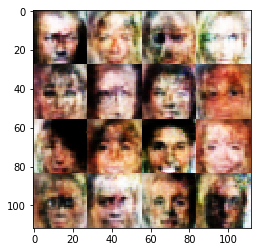

Epoch 0/2... Discriminator Loss: 0.9080... Generator Loss: 1.4141
Epoch 0/2... Discriminator Loss: 0.4994... Generator Loss: 2.9850
Epoch 0/2... Discriminator Loss: 0.5715... Generator Loss: 2.0265
Epoch 0/2... Discriminator Loss: 0.4946... Generator Loss: 2.7484
Epoch 0/2... Discriminator Loss: 0.7313... Generator Loss: 3.7865


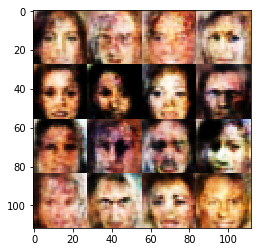

Epoch 0/2... Discriminator Loss: 0.9100... Generator Loss: 3.0050
Epoch 0/2... Discriminator Loss: 0.6993... Generator Loss: 1.5292
Epoch 0/2... Discriminator Loss: 0.5989... Generator Loss: 3.3639
Epoch 0/2... Discriminator Loss: 0.7613... Generator Loss: 1.5717
Epoch 0/2... Discriminator Loss: 0.7005... Generator Loss: 2.0223


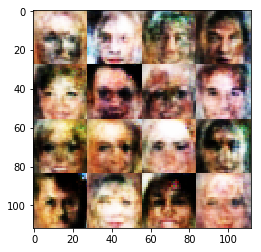

Epoch 0/2... Discriminator Loss: 0.8242... Generator Loss: 1.6712
Epoch 0/2... Discriminator Loss: 0.6819... Generator Loss: 1.6639
Epoch 0/2... Discriminator Loss: 0.5941... Generator Loss: 1.7083
Epoch 0/2... Discriminator Loss: 0.4865... Generator Loss: 2.9878
Epoch 0/2... Discriminator Loss: 0.5778... Generator Loss: 2.2037


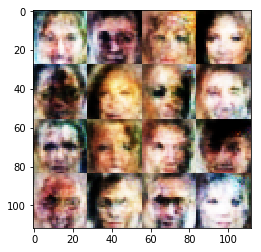

Epoch 0/2... Discriminator Loss: 0.6385... Generator Loss: 2.0713
Epoch 0/2... Discriminator Loss: 0.4215... Generator Loss: 3.0772
Epoch 0/2... Discriminator Loss: 0.6454... Generator Loss: 2.3041
Epoch 0/2... Discriminator Loss: 0.9058... Generator Loss: 1.7881
Epoch 0/2... Discriminator Loss: 0.5972... Generator Loss: 1.7898


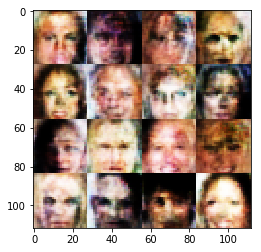

Epoch 0/2... Discriminator Loss: 0.5376... Generator Loss: 2.0708
Epoch 0/2... Discriminator Loss: 0.6655... Generator Loss: 1.4901
Epoch 0/2... Discriminator Loss: 0.5495... Generator Loss: 2.0078
Epoch 0/2... Discriminator Loss: 0.4450... Generator Loss: 3.4507
Epoch 0/2... Discriminator Loss: 0.4574... Generator Loss: 2.0951


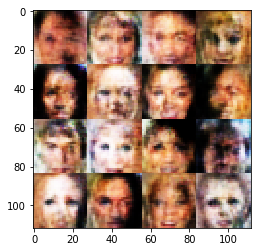

Epoch 0/2... Discriminator Loss: 0.4502... Generator Loss: 2.6321
Epoch 0/2... Discriminator Loss: 0.4359... Generator Loss: 3.5089
Epoch 0/2... Discriminator Loss: 0.3928... Generator Loss: 3.4178
Epoch 0/2... Discriminator Loss: 2.0819... Generator Loss: 0.4048
Epoch 0/2... Discriminator Loss: 0.6446... Generator Loss: 2.8253


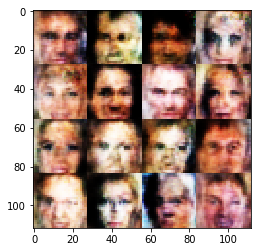

Epoch 0/2... Discriminator Loss: 0.5049... Generator Loss: 2.6908
Epoch 0/2... Discriminator Loss: 0.7730... Generator Loss: 1.7993
Epoch 0/2... Discriminator Loss: 0.5723... Generator Loss: 2.6294
Epoch 0/2... Discriminator Loss: 0.5978... Generator Loss: 1.8844
Epoch 0/2... Discriminator Loss: 0.4845... Generator Loss: 2.5486


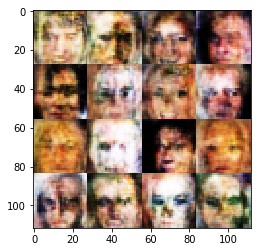

Epoch 0/2... Discriminator Loss: 0.4895... Generator Loss: 2.9604
Epoch 0/2... Discriminator Loss: 0.5198... Generator Loss: 2.5712
Epoch 0/2... Discriminator Loss: 0.4862... Generator Loss: 2.5902
Epoch 0/2... Discriminator Loss: 0.6829... Generator Loss: 2.3985
Epoch 0/2... Discriminator Loss: 1.3237... Generator Loss: 3.2530


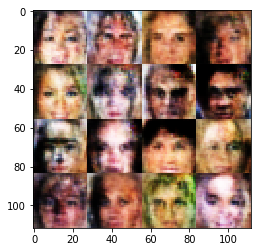

Epoch 0/2... Discriminator Loss: 3.2044... Generator Loss: 4.6250
Epoch 0/2... Discriminator Loss: 1.2208... Generator Loss: 1.9805
Epoch 0/2... Discriminator Loss: 0.8905... Generator Loss: 2.3588
Epoch 0/2... Discriminator Loss: 0.7753... Generator Loss: 1.3386
Epoch 0/2... Discriminator Loss: 1.0139... Generator Loss: 2.2636


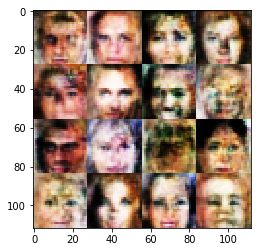

Epoch 0/2... Discriminator Loss: 0.6055... Generator Loss: 1.7747
Epoch 0/2... Discriminator Loss: 0.4638... Generator Loss: 2.9400
Epoch 0/2... Discriminator Loss: 0.7046... Generator Loss: 1.8142
Epoch 0/2... Discriminator Loss: 0.7618... Generator Loss: 1.7617
Epoch 0/2... Discriminator Loss: 0.8158... Generator Loss: 1.4907


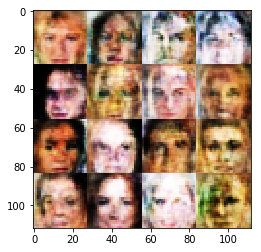

Epoch 0/2... Discriminator Loss: 0.4445... Generator Loss: 3.8236
Epoch 0/2... Discriminator Loss: 0.5041... Generator Loss: 2.1076
Epoch 0/2... Discriminator Loss: 0.6325... Generator Loss: 2.4590
Epoch 0/2... Discriminator Loss: 1.6584... Generator Loss: 0.5466
Epoch 0/2... Discriminator Loss: 0.5639... Generator Loss: 2.6179


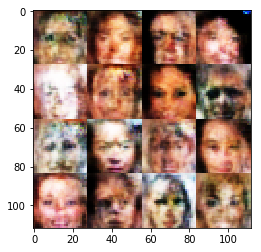

Epoch 0/2... Discriminator Loss: 0.4789... Generator Loss: 2.6975
Epoch 0/2... Discriminator Loss: 0.4260... Generator Loss: 2.7721
Epoch 0/2... Discriminator Loss: 0.4335... Generator Loss: 3.4997
Epoch 0/2... Discriminator Loss: 0.4755... Generator Loss: 2.4960
Epoch 0/2... Discriminator Loss: 0.5414... Generator Loss: 2.4902


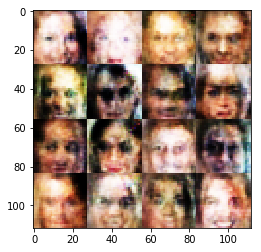

Epoch 0/2... Discriminator Loss: 0.9075... Generator Loss: 1.3368
Epoch 0/2... Discriminator Loss: 0.5290... Generator Loss: 2.9877
Epoch 0/2... Discriminator Loss: 0.4424... Generator Loss: 2.9802
Epoch 0/2... Discriminator Loss: 0.4718... Generator Loss: 3.2005
Epoch 0/2... Discriminator Loss: 0.9550... Generator Loss: 1.1733


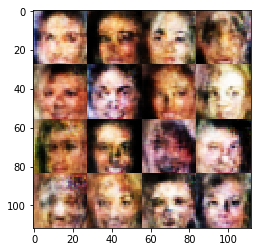

Epoch 0/2... Discriminator Loss: 0.9075... Generator Loss: 0.8810
Epoch 0/2... Discriminator Loss: 0.5848... Generator Loss: 2.3609
Epoch 0/2... Discriminator Loss: 0.4267... Generator Loss: 3.0471
Epoch 0/2... Discriminator Loss: 0.5165... Generator Loss: 2.8100
Epoch 0/2... Discriminator Loss: 0.6247... Generator Loss: 2.3009


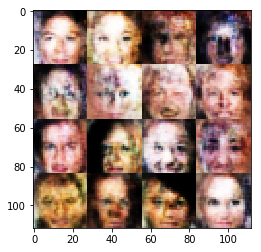

Epoch 0/2... Discriminator Loss: 0.5284... Generator Loss: 2.2513
Epoch 0/2... Discriminator Loss: 0.4685... Generator Loss: 3.9336
Epoch 0/2... Discriminator Loss: 0.4750... Generator Loss: 2.5647
Epoch 0/2... Discriminator Loss: 0.6025... Generator Loss: 1.9372
Epoch 0/2... Discriminator Loss: 0.6528... Generator Loss: 2.0411


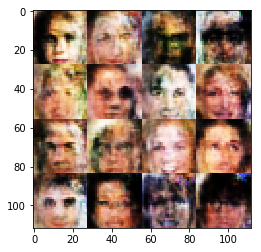

Epoch 0/2... Discriminator Loss: 0.4381... Generator Loss: 3.6841
Epoch 0/2... Discriminator Loss: 0.4286... Generator Loss: 2.8451
Epoch 0/2... Discriminator Loss: 0.5633... Generator Loss: 2.9593
Epoch 0/2... Discriminator Loss: 0.5555... Generator Loss: 2.8230
Epoch 0/2... Discriminator Loss: 0.4568... Generator Loss: 2.9762


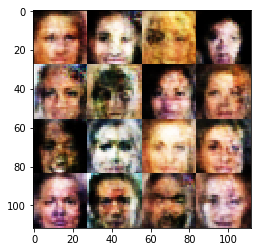

Epoch 0/2... Discriminator Loss: 2.6849... Generator Loss: 0.2692
Epoch 0/2... Discriminator Loss: 0.6898... Generator Loss: 2.3796
Epoch 0/2... Discriminator Loss: 0.7956... Generator Loss: 2.0874
Epoch 0/2... Discriminator Loss: 0.7726... Generator Loss: 2.2429
Epoch 0/2... Discriminator Loss: 0.4782... Generator Loss: 3.8322


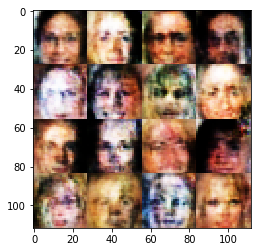

Epoch 0/2... Discriminator Loss: 0.4113... Generator Loss: 4.2575
Epoch 0/2... Discriminator Loss: 0.3750... Generator Loss: 4.2753
Epoch 0/2... Discriminator Loss: 0.5934... Generator Loss: 2.2015
Epoch 0/2... Discriminator Loss: 0.4919... Generator Loss: 1.5724
Epoch 0/2... Discriminator Loss: 0.5049... Generator Loss: 2.3507


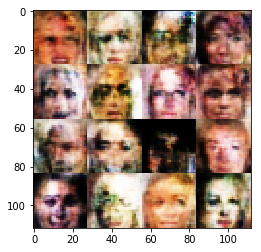

Epoch 0/2... Discriminator Loss: 1.0863... Generator Loss: 2.2709
Epoch 0/2... Discriminator Loss: 0.6340... Generator Loss: 2.0599
Epoch 0/2... Discriminator Loss: 0.4134... Generator Loss: 4.1131
Epoch 0/2... Discriminator Loss: 0.6045... Generator Loss: 1.5208
Epoch 0/2... Discriminator Loss: 0.7147... Generator Loss: 1.7766


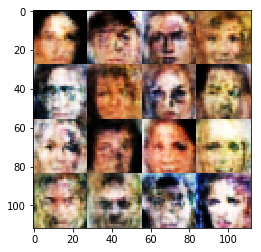

Epoch 0/2... Discriminator Loss: 0.6473... Generator Loss: 1.5123
Epoch 0/2... Discriminator Loss: 0.9634... Generator Loss: 0.9295
Epoch 0/2... Discriminator Loss: 0.6242... Generator Loss: 1.7694
Epoch 0/2... Discriminator Loss: 0.6808... Generator Loss: 1.9526
Epoch 0/2... Discriminator Loss: 1.3011... Generator Loss: 0.6861


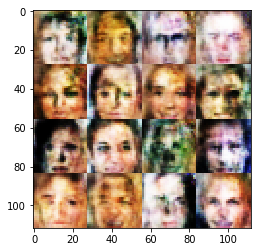

Epoch 0/2... Discriminator Loss: 0.6579... Generator Loss: 3.6769
Epoch 0/2... Discriminator Loss: 1.0193... Generator Loss: 3.4591
Epoch 0/2... Discriminator Loss: 0.5514... Generator Loss: 2.3817
Epoch 0/2... Discriminator Loss: 0.5572... Generator Loss: 2.3452
Epoch 0/2... Discriminator Loss: 0.5935... Generator Loss: 2.0129


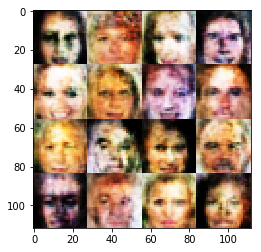

Epoch 0/2... Discriminator Loss: 0.4849... Generator Loss: 2.4873
Epoch 0/2... Discriminator Loss: 0.5158... Generator Loss: 2.3895
Epoch 0/2... Discriminator Loss: 0.5106... Generator Loss: 2.2160
Epoch 0/2... Discriminator Loss: 0.4358... Generator Loss: 3.0099
Epoch 0/2... Discriminator Loss: 0.6015... Generator Loss: 2.3159


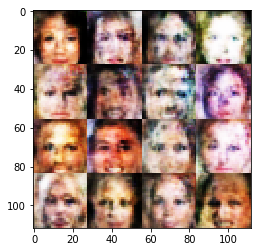

Epoch 0/2... Discriminator Loss: 0.6473... Generator Loss: 2.0774
Epoch 0/2... Discriminator Loss: 0.4317... Generator Loss: 3.7875
Epoch 0/2... Discriminator Loss: 0.6884... Generator Loss: 1.6108
Epoch 0/2... Discriminator Loss: 0.6330... Generator Loss: 1.6056
Epoch 0/2... Discriminator Loss: 0.5939... Generator Loss: 3.6410


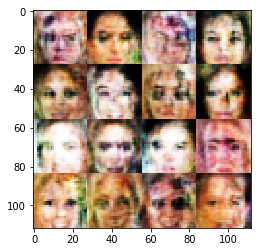

Epoch 0/2... Discriminator Loss: 0.4719... Generator Loss: 2.2937
Epoch 0/2... Discriminator Loss: 1.1139... Generator Loss: 0.8930
Epoch 0/2... Discriminator Loss: 0.5718... Generator Loss: 2.3318
Epoch 0/2... Discriminator Loss: 0.6384... Generator Loss: 3.4344
Epoch 0/2... Discriminator Loss: 0.4477... Generator Loss: 2.8002


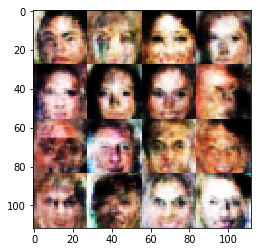

Epoch 0/2... Discriminator Loss: 0.4442... Generator Loss: 3.2327
Epoch 0/2... Discriminator Loss: 0.6306... Generator Loss: 2.1472
Epoch 0/2... Discriminator Loss: 0.4583... Generator Loss: 4.6024
Epoch 0/2... Discriminator Loss: 0.4715... Generator Loss: 2.0021
Epoch 0/2... Discriminator Loss: 0.7656... Generator Loss: 1.2068


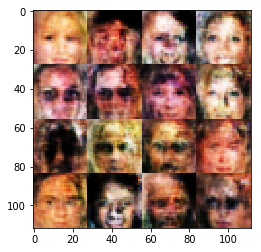

Epoch 0/2... Discriminator Loss: 1.4645... Generator Loss: 3.7029
Epoch 0/2... Discriminator Loss: 0.6264... Generator Loss: 2.4409
Epoch 0/2... Discriminator Loss: 1.9005... Generator Loss: 0.7044
Epoch 0/2... Discriminator Loss: 0.5530... Generator Loss: 2.9527
Epoch 0/2... Discriminator Loss: 0.6204... Generator Loss: 2.1434


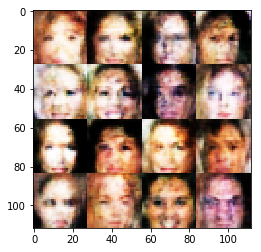

Epoch 0/2... Discriminator Loss: 0.5537... Generator Loss: 2.8618
Epoch 0/2... Discriminator Loss: 1.0652... Generator Loss: 1.0454
Epoch 0/2... Discriminator Loss: 1.2547... Generator Loss: 0.8652
Epoch 0/2... Discriminator Loss: 0.5663... Generator Loss: 2.5163
Epoch 0/2... Discriminator Loss: 0.8923... Generator Loss: 0.9256


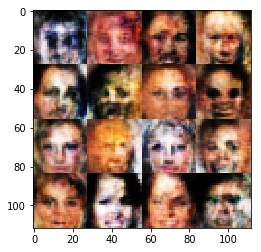

Epoch 0/2... Discriminator Loss: 0.6564... Generator Loss: 1.9888
Epoch 0/2... Discriminator Loss: 1.2245... Generator Loss: 1.7956
Epoch 0/2... Discriminator Loss: 0.6135... Generator Loss: 1.8272
Epoch 0/2... Discriminator Loss: 0.7025... Generator Loss: 1.1497
Epoch 0/2... Discriminator Loss: 1.1113... Generator Loss: 3.8764


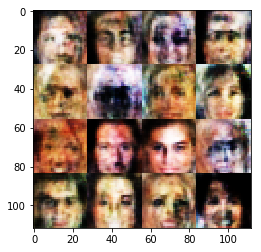

Epoch 0/2... Discriminator Loss: 0.6619... Generator Loss: 1.2455
Epoch 0/2... Discriminator Loss: 0.5527... Generator Loss: 4.0446
Epoch 0/2... Discriminator Loss: 0.5687... Generator Loss: 2.4441
Epoch 0/2... Discriminator Loss: 0.6010... Generator Loss: 2.0647
Epoch 0/2... Discriminator Loss: 0.5613... Generator Loss: 2.8878


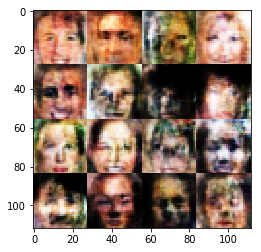

Epoch 0/2... Discriminator Loss: 0.3675... Generator Loss: 4.6567
Epoch 0/2... Discriminator Loss: 0.7473... Generator Loss: 1.6475
Epoch 0/2... Discriminator Loss: 0.4155... Generator Loss: 3.8563
Epoch 0/2... Discriminator Loss: 1.1603... Generator Loss: 1.9186
Epoch 0/2... Discriminator Loss: 1.7554... Generator Loss: 0.5182


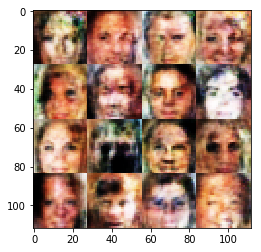

Epoch 0/2... Discriminator Loss: 1.6825... Generator Loss: 2.8495
Epoch 0/2... Discriminator Loss: 1.1038... Generator Loss: 1.2846
Epoch 0/2... Discriminator Loss: 0.4992... Generator Loss: 2.3590
Epoch 0/2... Discriminator Loss: 0.4556... Generator Loss: 2.2106
Epoch 0/2... Discriminator Loss: 0.8436... Generator Loss: 1.7215


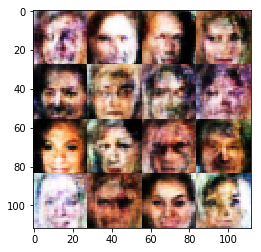

Epoch 0/2... Discriminator Loss: 0.6000... Generator Loss: 1.7834
Epoch 0/2... Discriminator Loss: 0.6821... Generator Loss: 1.7933
Epoch 0/2... Discriminator Loss: 0.8245... Generator Loss: 1.4678
Epoch 0/2... Discriminator Loss: 0.4845... Generator Loss: 2.5410
Epoch 0/2... Discriminator Loss: 0.4910... Generator Loss: 2.8072


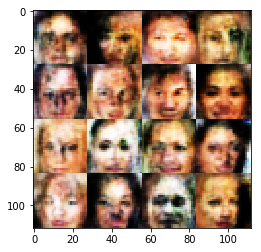

Epoch 0/2... Discriminator Loss: 0.5614... Generator Loss: 1.8347
Epoch 0/2... Discriminator Loss: 0.4740... Generator Loss: 2.7089
Epoch 0/2... Discriminator Loss: 0.5612... Generator Loss: 1.8306
Epoch 0/2... Discriminator Loss: 0.4577... Generator Loss: 3.8239
Epoch 0/2... Discriminator Loss: 0.6965... Generator Loss: 1.6740


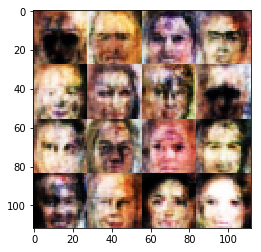

Epoch 0/2... Discriminator Loss: 0.5651... Generator Loss: 2.1987
Epoch 0/2... Discriminator Loss: 0.4853... Generator Loss: 2.8636
Epoch 0/2... Discriminator Loss: 0.4474... Generator Loss: 3.0165
Epoch 0/2... Discriminator Loss: 0.4176... Generator Loss: 3.5699
Epoch 0/2... Discriminator Loss: 1.4161... Generator Loss: 3.0064


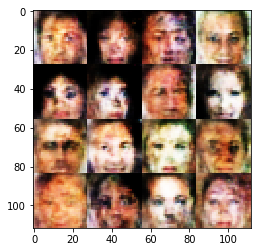

Epoch 0/2... Discriminator Loss: 0.5448... Generator Loss: 3.7822
Epoch 0/2... Discriminator Loss: 1.1195... Generator Loss: 0.9935
Epoch 0/2... Discriminator Loss: 0.4909... Generator Loss: 3.3048
Epoch 0/2... Discriminator Loss: 0.4800... Generator Loss: 2.6090
Epoch 0/2... Discriminator Loss: 1.3432... Generator Loss: 2.8927


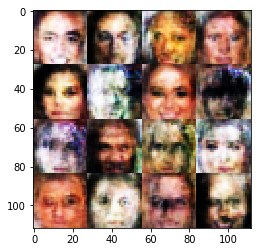

Epoch 0/2... Discriminator Loss: 0.8428... Generator Loss: 1.3016
Epoch 0/2... Discriminator Loss: 0.4641... Generator Loss: 2.9919
Epoch 0/2... Discriminator Loss: 0.8696... Generator Loss: 1.0609
Epoch 0/2... Discriminator Loss: 0.5340... Generator Loss: 2.9162
Epoch 0/2... Discriminator Loss: 0.4994... Generator Loss: 2.7535


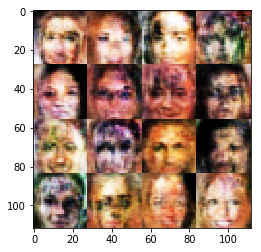

Epoch 0/2... Discriminator Loss: 0.4212... Generator Loss: 3.2799
Epoch 0/2... Discriminator Loss: 0.8243... Generator Loss: 1.3978
Epoch 0/2... Discriminator Loss: 0.6023... Generator Loss: 2.6096
Epoch 0/2... Discriminator Loss: 1.8540... Generator Loss: 0.6855
Epoch 0/2... Discriminator Loss: 0.6370... Generator Loss: 2.5407


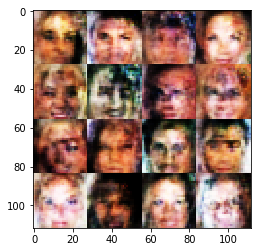

Epoch 0/2... Discriminator Loss: 0.5942... Generator Loss: 2.2148
Epoch 0/2... Discriminator Loss: 0.5361... Generator Loss: 2.6353
Epoch 0/2... Discriminator Loss: 0.6492... Generator Loss: 1.3973
Epoch 0/2... Discriminator Loss: 0.4898... Generator Loss: 2.8753
Epoch 0/2... Discriminator Loss: 0.4969... Generator Loss: 2.0468


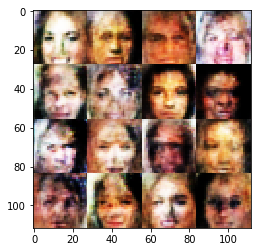

Epoch 0/2... Discriminator Loss: 0.4971... Generator Loss: 3.0623
Epoch 0/2... Discriminator Loss: 0.6215... Generator Loss: 1.8485
Epoch 0/2... Discriminator Loss: 0.6075... Generator Loss: 1.8663
Epoch 0/2... Discriminator Loss: 0.5825... Generator Loss: 2.1017
Epoch 0/2... Discriminator Loss: 0.6294... Generator Loss: 1.9441


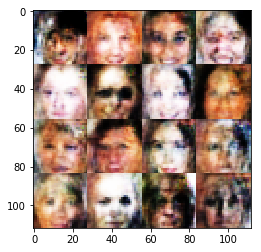

Epoch 0/2... Discriminator Loss: 0.8952... Generator Loss: 3.6634
Epoch 0/2... Discriminator Loss: 0.6186... Generator Loss: 2.4405
Epoch 0/2... Discriminator Loss: 0.4953... Generator Loss: 2.1004
Epoch 0/2... Discriminator Loss: 1.8446... Generator Loss: 0.5767
Epoch 0/2... Discriminator Loss: 0.8479... Generator Loss: 1.5832


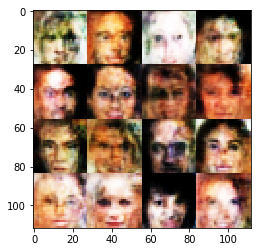

Epoch 0/2... Discriminator Loss: 0.6309... Generator Loss: 2.2051
Epoch 0/2... Discriminator Loss: 0.6488... Generator Loss: 3.6976
Epoch 0/2... Discriminator Loss: 0.8505... Generator Loss: 1.2385
Epoch 0/2... Discriminator Loss: 0.7286... Generator Loss: 1.9288
Epoch 0/2... Discriminator Loss: 0.5733... Generator Loss: 2.4029


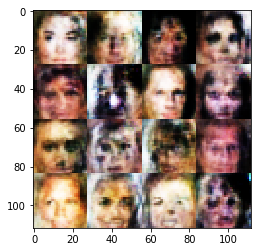

Epoch 0/2... Discriminator Loss: 0.6522... Generator Loss: 2.4415
Epoch 0/2... Discriminator Loss: 0.5354... Generator Loss: 2.4814
Epoch 0/2... Discriminator Loss: 0.4735... Generator Loss: 3.4879
Epoch 0/2... Discriminator Loss: 0.5352... Generator Loss: 2.1913
Epoch 0/2... Discriminator Loss: 0.5424... Generator Loss: 1.9121


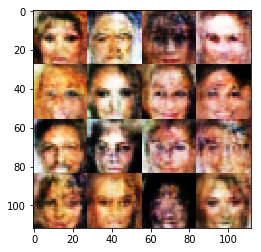

Epoch 0/2... Discriminator Loss: 0.5244... Generator Loss: 2.5192
Epoch 0/2... Discriminator Loss: 0.5230... Generator Loss: 3.0727
Epoch 0/2... Discriminator Loss: 0.6143... Generator Loss: 2.2586
Epoch 0/2... Discriminator Loss: 0.7646... Generator Loss: 1.9928
Epoch 0/2... Discriminator Loss: 0.4995... Generator Loss: 2.6396


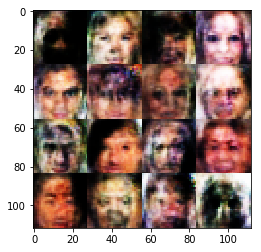

Epoch 0/2... Discriminator Loss: 0.5679... Generator Loss: 2.1898
Epoch 0/2... Discriminator Loss: 0.7933... Generator Loss: 1.3807
Epoch 0/2... Discriminator Loss: 0.7953... Generator Loss: 1.7178
Epoch 0/2... Discriminator Loss: 0.8663... Generator Loss: 1.3299
Epoch 0/2... Discriminator Loss: 0.6620... Generator Loss: 1.7413


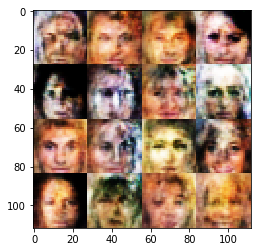

Epoch 0/2... Discriminator Loss: 0.6568... Generator Loss: 1.7814
Epoch 0/2... Discriminator Loss: 0.6325... Generator Loss: 2.1277
Epoch 0/2... Discriminator Loss: 0.7198... Generator Loss: 2.1808
Epoch 0/2... Discriminator Loss: 0.4001... Generator Loss: 3.6241
Epoch 0/2... Discriminator Loss: 0.5153... Generator Loss: 2.3914


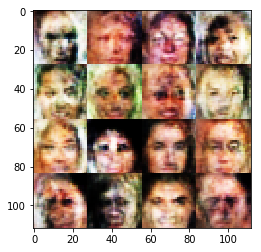

Epoch 0/2... Discriminator Loss: 1.2372... Generator Loss: 1.0549
Epoch 0/2... Discriminator Loss: 1.6269... Generator Loss: 0.5202
Epoch 0/2... Discriminator Loss: 0.6329... Generator Loss: 1.9714
Epoch 0/2... Discriminator Loss: 0.5168... Generator Loss: 1.7306
Epoch 0/2... Discriminator Loss: 0.4408... Generator Loss: 3.5554


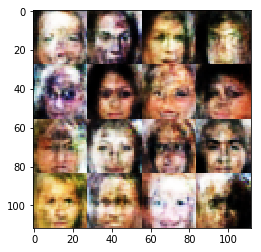

Epoch 0/2... Discriminator Loss: 0.4215... Generator Loss: 3.5449
Epoch 0/2... Discriminator Loss: 0.6106... Generator Loss: 1.9102
Epoch 0/2... Discriminator Loss: 0.4556... Generator Loss: 3.0241
Epoch 1/2... Discriminator Loss: 0.5095... Generator Loss: 2.8102
Epoch 1/2... Discriminator Loss: 0.7434... Generator Loss: 1.9048


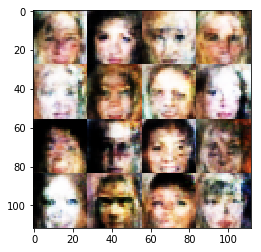

Epoch 1/2... Discriminator Loss: 0.4297... Generator Loss: 3.2771
Epoch 1/2... Discriminator Loss: 0.9124... Generator Loss: 1.2032
Epoch 1/2... Discriminator Loss: 0.7428... Generator Loss: 1.5222
Epoch 1/2... Discriminator Loss: 1.2185... Generator Loss: 1.9694
Epoch 1/2... Discriminator Loss: 0.4180... Generator Loss: 3.6507


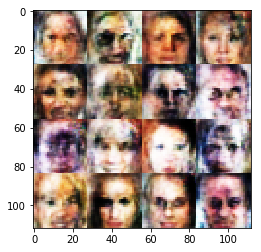

Epoch 1/2... Discriminator Loss: 0.6673... Generator Loss: 3.8089
Epoch 1/2... Discriminator Loss: 0.8842... Generator Loss: 1.5912
Epoch 1/2... Discriminator Loss: 1.0739... Generator Loss: 2.8973
Epoch 1/2... Discriminator Loss: 0.6233... Generator Loss: 1.6876
Epoch 1/2... Discriminator Loss: 0.9567... Generator Loss: 1.5387


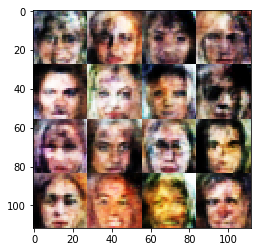

Epoch 1/2... Discriminator Loss: 0.4971... Generator Loss: 2.2986
Epoch 1/2... Discriminator Loss: 0.7552... Generator Loss: 1.1502
Epoch 1/2... Discriminator Loss: 0.4162... Generator Loss: 3.1013
Epoch 1/2... Discriminator Loss: 0.6982... Generator Loss: 1.4864
Epoch 1/2... Discriminator Loss: 0.4761... Generator Loss: 2.7302


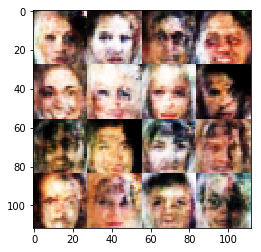

Epoch 1/2... Discriminator Loss: 0.8600... Generator Loss: 1.3010
Epoch 1/2... Discriminator Loss: 0.7136... Generator Loss: 2.3749
Epoch 1/2... Discriminator Loss: 3.0995... Generator Loss: 5.2590
Epoch 1/2... Discriminator Loss: 0.7456... Generator Loss: 2.2115
Epoch 1/2... Discriminator Loss: 0.8875... Generator Loss: 1.1194


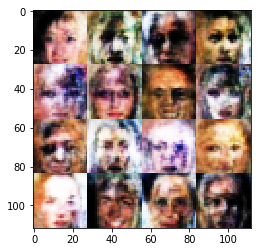

Epoch 1/2... Discriminator Loss: 0.6543... Generator Loss: 2.7931
Epoch 1/2... Discriminator Loss: 1.0439... Generator Loss: 0.9833
Epoch 1/2... Discriminator Loss: 0.6136... Generator Loss: 1.7104
Epoch 1/2... Discriminator Loss: 0.4293... Generator Loss: 3.9782
Epoch 1/2... Discriminator Loss: 0.6212... Generator Loss: 2.2560


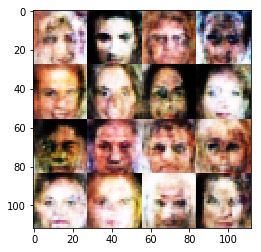

Epoch 1/2... Discriminator Loss: 0.9136... Generator Loss: 0.9894
Epoch 1/2... Discriminator Loss: 0.8910... Generator Loss: 0.7020
Epoch 1/2... Discriminator Loss: 0.5794... Generator Loss: 2.4765
Epoch 1/2... Discriminator Loss: 0.6987... Generator Loss: 1.4827
Epoch 1/2... Discriminator Loss: 0.4653... Generator Loss: 3.1215


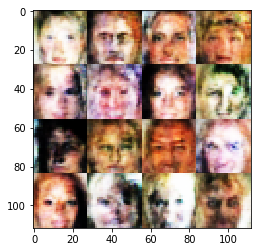

Epoch 1/2... Discriminator Loss: 0.9055... Generator Loss: 1.3780
Epoch 1/2... Discriminator Loss: 0.6762... Generator Loss: 2.8601
Epoch 1/2... Discriminator Loss: 0.8358... Generator Loss: 1.5322
Epoch 1/2... Discriminator Loss: 0.4711... Generator Loss: 2.9649
Epoch 1/2... Discriminator Loss: 0.4486... Generator Loss: 3.6221


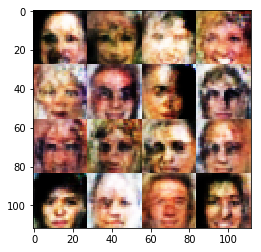

Epoch 1/2... Discriminator Loss: 0.9024... Generator Loss: 1.6143
Epoch 1/2... Discriminator Loss: 0.6983... Generator Loss: 1.6659
Epoch 1/2... Discriminator Loss: 0.5861... Generator Loss: 2.3494
Epoch 1/2... Discriminator Loss: 0.5897... Generator Loss: 2.7541
Epoch 1/2... Discriminator Loss: 0.5039... Generator Loss: 3.1708


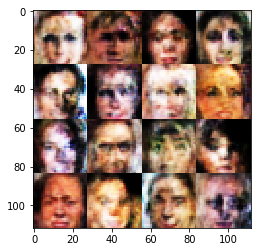

Epoch 1/2... Discriminator Loss: 0.9567... Generator Loss: 1.9066
Epoch 1/2... Discriminator Loss: 0.4880... Generator Loss: 2.4596
Epoch 1/2... Discriminator Loss: 0.5846... Generator Loss: 2.0546
Epoch 1/2... Discriminator Loss: 0.7076... Generator Loss: 1.2978
Epoch 1/2... Discriminator Loss: 0.4290... Generator Loss: 2.9408


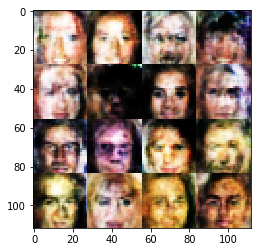

Epoch 1/2... Discriminator Loss: 0.5152... Generator Loss: 3.2834
Epoch 1/2... Discriminator Loss: 0.8425... Generator Loss: 3.6159
Epoch 1/2... Discriminator Loss: 0.5466... Generator Loss: 2.7080
Epoch 1/2... Discriminator Loss: 0.5729... Generator Loss: 3.4413
Epoch 1/2... Discriminator Loss: 0.6728... Generator Loss: 2.4686


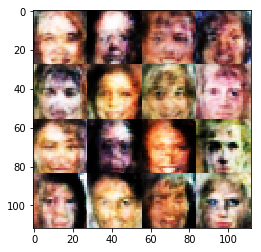

Epoch 1/2... Discriminator Loss: 1.1414... Generator Loss: 1.1061
Epoch 1/2... Discriminator Loss: 0.8182... Generator Loss: 1.7783
Epoch 1/2... Discriminator Loss: 0.5502... Generator Loss: 2.2442
Epoch 1/2... Discriminator Loss: 0.6336... Generator Loss: 4.3329
Epoch 1/2... Discriminator Loss: 1.0033... Generator Loss: 1.8545


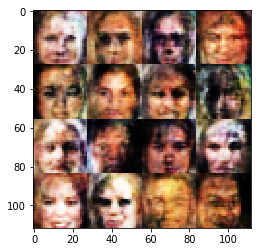

Epoch 1/2... Discriminator Loss: 0.6825... Generator Loss: 2.1297
Epoch 1/2... Discriminator Loss: 0.4667... Generator Loss: 3.2322
Epoch 1/2... Discriminator Loss: 0.6065... Generator Loss: 2.2196
Epoch 1/2... Discriminator Loss: 0.4278... Generator Loss: 3.5065
Epoch 1/2... Discriminator Loss: 0.4863... Generator Loss: 3.1771


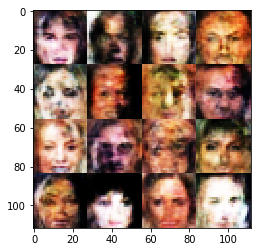

Epoch 1/2... Discriminator Loss: 0.5328... Generator Loss: 2.0023
Epoch 1/2... Discriminator Loss: 0.5886... Generator Loss: 2.4265
Epoch 1/2... Discriminator Loss: 0.4545... Generator Loss: 3.5993
Epoch 1/2... Discriminator Loss: 0.5406... Generator Loss: 2.8845
Epoch 1/2... Discriminator Loss: 0.5571... Generator Loss: 3.0762


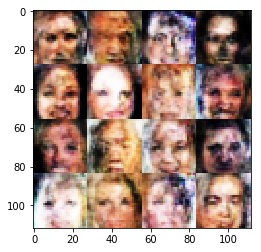

Epoch 1/2... Discriminator Loss: 0.4558... Generator Loss: 2.0989
Epoch 1/2... Discriminator Loss: 1.5716... Generator Loss: 3.4905
Epoch 1/2... Discriminator Loss: 0.6841... Generator Loss: 2.9673
Epoch 1/2... Discriminator Loss: 0.4535... Generator Loss: 2.7054
Epoch 1/2... Discriminator Loss: 1.3549... Generator Loss: 0.9603


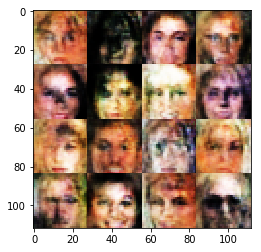

Epoch 1/2... Discriminator Loss: 0.5007... Generator Loss: 3.2787
Epoch 1/2... Discriminator Loss: 0.5092... Generator Loss: 3.0996
Epoch 1/2... Discriminator Loss: 0.8203... Generator Loss: 1.1004
Epoch 1/2... Discriminator Loss: 0.5663... Generator Loss: 1.8747
Epoch 1/2... Discriminator Loss: 0.5325... Generator Loss: 1.9048


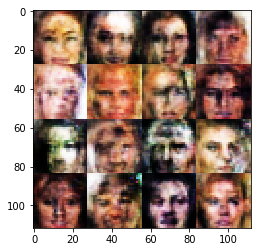

Epoch 1/2... Discriminator Loss: 0.4516... Generator Loss: 2.8186
Epoch 1/2... Discriminator Loss: 0.4507... Generator Loss: 3.0443
Epoch 1/2... Discriminator Loss: 0.4917... Generator Loss: 2.1893
Epoch 1/2... Discriminator Loss: 0.7959... Generator Loss: 1.1732
Epoch 1/2... Discriminator Loss: 0.6337... Generator Loss: 1.6906


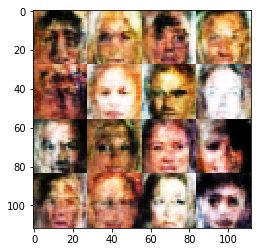

Epoch 1/2... Discriminator Loss: 0.8106... Generator Loss: 1.3540
Epoch 1/2... Discriminator Loss: 0.5563... Generator Loss: 3.7079
Epoch 1/2... Discriminator Loss: 0.4801... Generator Loss: 2.7504
Epoch 1/2... Discriminator Loss: 0.5655... Generator Loss: 2.2963
Epoch 1/2... Discriminator Loss: 0.5280... Generator Loss: 2.0715


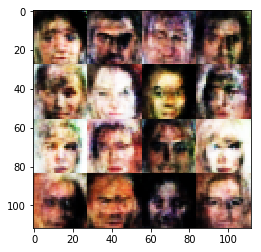

Epoch 1/2... Discriminator Loss: 1.5035... Generator Loss: 2.9362
Epoch 1/2... Discriminator Loss: 0.6382... Generator Loss: 1.9975
Epoch 1/2... Discriminator Loss: 0.7362... Generator Loss: 1.2630
Epoch 1/2... Discriminator Loss: 0.5575... Generator Loss: 3.5738
Epoch 1/2... Discriminator Loss: 0.5522... Generator Loss: 1.8855


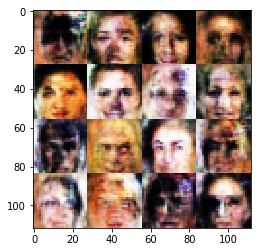

Epoch 1/2... Discriminator Loss: 0.4732... Generator Loss: 2.1949
Epoch 1/2... Discriminator Loss: 0.4481... Generator Loss: 3.2050
Epoch 1/2... Discriminator Loss: 0.6250... Generator Loss: 1.8992
Epoch 1/2... Discriminator Loss: 0.6013... Generator Loss: 1.9881
Epoch 1/2... Discriminator Loss: 0.5571... Generator Loss: 2.2087


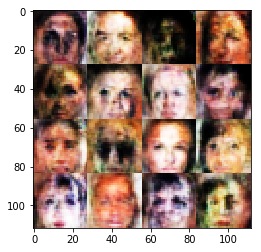

Epoch 1/2... Discriminator Loss: 0.9445... Generator Loss: 1.4421
Epoch 1/2... Discriminator Loss: 0.9463... Generator Loss: 1.3731
Epoch 1/2... Discriminator Loss: 0.4435... Generator Loss: 2.8396
Epoch 1/2... Discriminator Loss: 0.6470... Generator Loss: 2.3526
Epoch 1/2... Discriminator Loss: 0.7110... Generator Loss: 1.8287


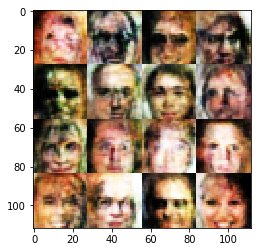

Epoch 1/2... Discriminator Loss: 0.6294... Generator Loss: 2.8291
Epoch 1/2... Discriminator Loss: 0.5113... Generator Loss: 2.4345
Epoch 1/2... Discriminator Loss: 0.4329... Generator Loss: 3.3019
Epoch 1/2... Discriminator Loss: 0.5642... Generator Loss: 5.6231
Epoch 1/2... Discriminator Loss: 0.5028... Generator Loss: 2.1898


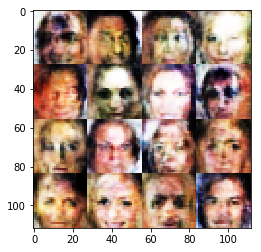

Epoch 1/2... Discriminator Loss: 0.4758... Generator Loss: 3.0728
Epoch 1/2... Discriminator Loss: 0.4832... Generator Loss: 3.7211
Epoch 1/2... Discriminator Loss: 0.4530... Generator Loss: 3.0846
Epoch 1/2... Discriminator Loss: 1.7773... Generator Loss: 0.5093
Epoch 1/2... Discriminator Loss: 0.7286... Generator Loss: 1.8692


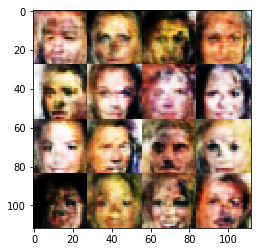

Epoch 1/2... Discriminator Loss: 0.5119... Generator Loss: 4.3817
Epoch 1/2... Discriminator Loss: 0.4881... Generator Loss: 2.5384
Epoch 1/2... Discriminator Loss: 0.4418... Generator Loss: 3.5060
Epoch 1/2... Discriminator Loss: 0.8336... Generator Loss: 3.1911
Epoch 1/2... Discriminator Loss: 0.4956... Generator Loss: 2.4614


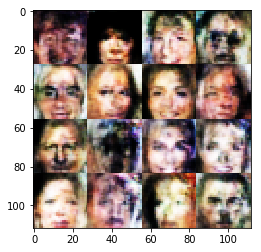

Epoch 1/2... Discriminator Loss: 0.7948... Generator Loss: 0.9238
Epoch 1/2... Discriminator Loss: 0.3936... Generator Loss: 3.8255
Epoch 1/2... Discriminator Loss: 0.7513... Generator Loss: 2.7414
Epoch 1/2... Discriminator Loss: 0.6609... Generator Loss: 3.5203
Epoch 1/2... Discriminator Loss: 1.0697... Generator Loss: 1.1508


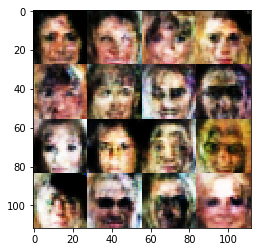

Epoch 1/2... Discriminator Loss: 0.5581... Generator Loss: 2.4354
Epoch 1/2... Discriminator Loss: 0.4398... Generator Loss: 4.1375
Epoch 1/2... Discriminator Loss: 0.5293... Generator Loss: 2.0774
Epoch 1/2... Discriminator Loss: 0.4639... Generator Loss: 3.0801
Epoch 1/2... Discriminator Loss: 0.4767... Generator Loss: 2.3497


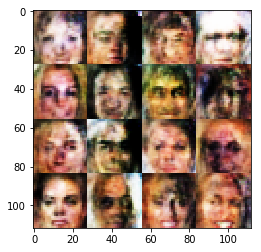

Epoch 1/2... Discriminator Loss: 0.4887... Generator Loss: 2.7622
Epoch 1/2... Discriminator Loss: 0.7292... Generator Loss: 1.7885
Epoch 1/2... Discriminator Loss: 0.5133... Generator Loss: 2.3163
Epoch 1/2... Discriminator Loss: 0.5165... Generator Loss: 3.1689
Epoch 1/2... Discriminator Loss: 0.9563... Generator Loss: 1.7251


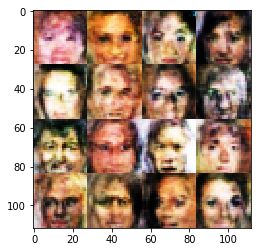

Epoch 1/2... Discriminator Loss: 0.5095... Generator Loss: 2.7078
Epoch 1/2... Discriminator Loss: 0.4910... Generator Loss: 3.4238
Epoch 1/2... Discriminator Loss: 0.5000... Generator Loss: 2.5602
Epoch 1/2... Discriminator Loss: 0.4940... Generator Loss: 3.0011
Epoch 1/2... Discriminator Loss: 1.0917... Generator Loss: 3.6163


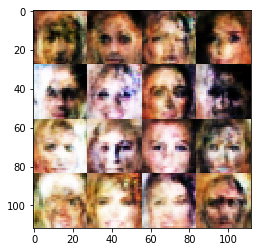

Epoch 1/2... Discriminator Loss: 0.6100... Generator Loss: 1.9476
Epoch 1/2... Discriminator Loss: 0.9284... Generator Loss: 0.9434
Epoch 1/2... Discriminator Loss: 0.5931... Generator Loss: 2.4471
Epoch 1/2... Discriminator Loss: 0.9905... Generator Loss: 2.9495
Epoch 1/2... Discriminator Loss: 1.0175... Generator Loss: 1.2578


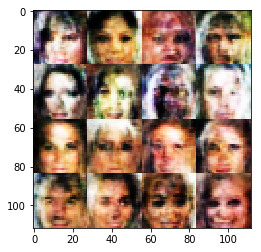

Epoch 1/2... Discriminator Loss: 0.5719... Generator Loss: 2.2227
Epoch 1/2... Discriminator Loss: 0.6780... Generator Loss: 2.2235
Epoch 1/2... Discriminator Loss: 0.5976... Generator Loss: 1.6973
Epoch 1/2... Discriminator Loss: 0.5177... Generator Loss: 2.0833
Epoch 1/2... Discriminator Loss: 0.5395... Generator Loss: 2.2778


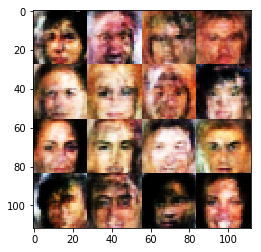

In [19]:
batch_size = 32
z_dim = 100
learning_rate = 0.0004
beta1 = 0.6


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.